In [4]:
import torch
import cv2
import pickle
import os
import numpy as np
import pandas as pd
import torch.nn as nn
import torch.optim as optim
import torchvision
import matplotlib.pyplot as plt
from tqdm import tqdm
from torchsummary import summary
from PIL import Image
import torch.nn.functional as F
from torch.utils.data.dataloader import DataLoader
import math

In [5]:
# loading detection data
voc_dataset_train = torchvision.datasets.VOCDetection(root="content/voc",
                                                image_set="train",
                                                download=True,
                                                year="2007")
voc_dataset_val = torchvision.datasets.VOCDetection(root="content/voc",
                                                image_set="val",
                                                download=True,
                                                year="2007")

Using downloaded and verified file: content/voc\VOCtrainval_06-Nov-2007.tar
Extracting content/voc\VOCtrainval_06-Nov-2007.tar to content/voc
Using downloaded and verified file: content/voc\VOCtrainval_06-Nov-2007.tar
Extracting content/voc\VOCtrainval_06-Nov-2007.tar to content/voc


In [6]:
print(f"Total sample in training data: {len(voc_dataset_train)}")
print(f"Total sample in validation data: {len(voc_dataset_val)}")

Total sample in training data: 2501
Total sample in validation data: 2510


In [ ]:
# data path 
# DON'T RUN
processed_faster_train = "Faster-RCNN/faster_train"
processed_faster_val = "Faster-RCNN/faster_val"

# create directory
os.makedirs(processed_faster_train, exist_ok=True)
os.makedirs(processed_faster_val, exist_ok=True)

#  checking the total samples in both train and validation after applying selective search  
print(f"Total training samples: {len(os.listdir(processed_faster_train))}")
print(f"Total validation samples: {len(os.listdir(processed_faster_val))}")

In [4]:
# waling through the dataset 
demo_data = voc_dataset_train[224]
demo_data

(<PIL.Image.Image image mode=RGB size=500x375>,
 {'annotation': {'folder': 'VOC2007',
   'filename': '000962.jpg',
   'source': {'database': 'The VOC2007 Database',
    'annotation': 'PASCAL VOC2007',
    'image': 'flickr',
    'flickrid': '320315288'},
   'owner': {'flickrid': 'peterjon', 'name': 'Peter'},
   'size': {'width': '500', 'height': '375', 'depth': '3'},
   'segmented': '0',
   'object': [{'name': 'cat',
     'pose': 'Left',
     'truncated': '0',
     'difficult': '0',
     'bndbox': {'xmin': '4', 'ymin': '137', 'xmax': '493', 'ymax': '375'}},
    {'name': 'pottedplant',
     'pose': 'Unspecified',
     'truncated': '1',
     'difficult': '1',
     'bndbox': {'xmin': '365', 'ymin': '1', 'xmax': '458', 'ymax': '149'}}]}})

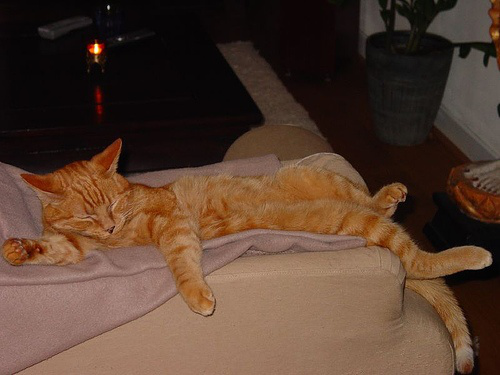

In [5]:
demo_data[0]

In [6]:
# Extract bounding boxes, labels, and ground truth from the target
img = demo_data[0]
# print(f"Image: {img}")
target = demo_data[1]
annotations = target['annotation']
# print(annotations)
objects = annotations['object']
# print(objects[1])
labels = [] 
bboxes = [] 
detections = []
for obj in objects:
    label = obj['name']
    bbox = obj['bndbox']
    bbox_coords = [
                int(bbox['xmin']), 
                int(bbox['ymin']), 
                int(bbox['xmax']), 
                int(bbox['ymax'])
            ]
    detections.append({'label': label , 'bbox': bbox_coords})
    
# print(detections)
img_info = {
    'file_name': img,
    'detections': detections
}

img_info

{'file_name': <PIL.Image.Image image mode=RGB size=500x375>,
 'detections': [{'label': 'cat', 'bbox': [4, 137, 493, 375]},
  {'label': 'pottedplant', 'bbox': [365, 1, 458, 149]}]}

In [ ]:
img_info['detections']

In [4]:
import os
import pickle
from tqdm import tqdm
from PIL import Image

def save_preprocessed_data(dataset, output_dir):
    os.makedirs(output_dir, exist_ok=True)  # Ensure the output directory exists
    
    for idx, (image, target) in tqdm(enumerate(dataset), total=len(dataset)):
        # Extract image and target information
        img_id = f"image_{idx:05d}"  # Unique identifier
        image_path = os.path.join(output_dir, f"{img_id}.jpg")

        # Convert the image for saving
        pil_image = image  # Assuming image is already a PIL image
        pil_image.save(image_path)

        # Extract bounding boxes and labels from the target
        annotations = target['annotation']
        detections = []
        
        for obj in annotations['object']:
            label = obj['name']  # Integer class label
            bbox = obj['bndbox']  # Bounding box coordinates
            bbox_coords = [
                int(bbox['xmin']), 
                int(bbox['ymin']), 
                int(bbox['xmax']), 
                int(bbox['ymax'])
            ]
            detections.append({'label': label, 'bbox': bbox_coords})

        # Create the desired `im_info` format
        im_info = {
            'img_name': image_path,
            'detections': detections
        }

        # Save the image information with pickle
        metadata_path = os.path.join(output_dir, f"{img_id}.pkl")
        with open(metadata_path, 'wb') as f:
            pickle.dump(im_info, f)


In [ ]:
# save train samples 
save_preprocessed_data(voc_dataset_train, processed_faster_train)

In [ ]:
# save validation samples 
save_preprocessed_data(voc_dataset_val, processed_faster_val)

In [7]:
"""
We create two dictionaries to map objects into class indexes, which is also known for labeling. Each type of objects will have a specific class indexes.
It will be helpful for both training and furthur usage. 
"""
obj_to_idx = {
    'background': 0,
    'aeroplane': 1, 'bicycle': 2,
    'bird': 3, 'boat': 4,
    'bottle': 5, 'bus': 6,
    'car': 7, 'cat': 8,
    'chair': 9, 'cow': 10,
    'diningtable': 11, 'dog': 12,
    'horse': 13, 'motorbike': 14,
    'person': 15, 'pottedplant': 16,
    'sheep': 17, 'sofa': 18,
    'train': 19, 'tvmonitor': 20
}

idx_to_obj = {value: key for key, value in obj_to_idx.items()}
print(idx_to_obj)


{0: 'background', 1: 'aeroplane', 2: 'bicycle', 3: 'bird', 4: 'boat', 5: 'bottle', 6: 'bus', 7: 'car', 8: 'cat', 9: 'chair', 10: 'cow', 11: 'diningtable', 12: 'dog', 13: 'horse', 14: 'motorbike', 15: 'person', 16: 'pottedplant', 17: 'sheep', 18: 'sofa', 19: 'train', 20: 'tvmonitor'}


In [8]:
# DON'T RUN
processed_faster_train = "Faster-RCNN/faster_train"
processed_faster_val = "Faster-RCNN/faster_val"

#  checking the total samples in both train and validation after applying selective search  
print(f"Total training samples: {len(os.listdir(processed_faster_train))}")
print(f"Total validation samples: {len(os.listdir(processed_faster_val))}")

Total training samples: 5002
Total validation samples: 5020


In [9]:
import os
import glob

train_folder = processed_faster_train
val_folder = processed_faster_val

train_metadata = glob.glob(os.path.join(train_folder, "*.pkl"))
val_metadata = glob.glob(os.path.join(val_folder, "*.pkl"))

print(f"Total training files: {len(train_metadata)}")
print(f"Total validation files: {len(val_metadata)}")


Total training files: 2501
Total validation files: 2510


In [10]:
import os
import glob

def get_annotation(data_path):
    meta_data = glob.glob(os.path.join(data_path, "*.pkl"))
    return meta_data

train_meta = get_annotation(processed_faster_train)
print(f"Total annotation for train data: {len(train_meta)}")

Total annotation for train data: 2501


In [11]:
# loading dataset
from torch.utils.data import Dataset
import random

class FasterDataLoader(Dataset):
    def __init__(self, data_path, split, transform=None, label_mapping=obj_to_idx):
        """
        Args:
            data_path: source directory where .pkl metadata files are contained.
            transform: Transformations to apply to images.
            label_mapping: Optional mapping for string labels to integers.
            split: data type -> train or validation 
        """
        self.data_path = data_path
        self.transform = transform
        self.label_mapping = label_mapping
        self.split = split
        self.metadata_files = get_annotation(data_path)

    def __len__(self):
        return len(self.metadata_files)


    def __getitem__(self, idx):
        metadata_path = self.metadata_files[idx]

        with open(metadata_path, 'rb') as f:
            metadata = pickle.load(f)

        image = Image.open(metadata['img_name']).convert('RGB')
        to_flip = False
        
        if self.split == 'train' and random.random() < 0.5:
            to_flip = True
            image = image.transpose(Image.FLIP_LEFT_RIGHT)
        
        im_tensor = torchvision.transforms.ToTensor()(image)
        detections = metadata['detections']
        
        if self.label_mapping:
            labels = [self.label_mapping[d['label']] for d in detections]  # T
        else:
            labels = [d['label'] for d in detections]
       
        targets = {}
        targets['bboxes'] = torch.as_tensor([detection['bbox'] for detection in metadata['detections']])
        targets['labels'] = torch.as_tensor(labels)
        
        if self.transform:
            image = self.transform(image)

        if to_flip:
            for idx, box in enumerate(targets['bboxes']):
                x1, y1, x2, y2 = box
                w = x2-x1
                im_w = im_tensor.shape[-1]
                x1 = im_w - x1 - w
                x2 = x1 + w
                targets['bboxes'][idx] = torch.as_tensor([x1, y1, x2, y2])
        return im_tensor, targets, metadata['img_name']


In [12]:
# Define any necessary transformations
from torchvision import transforms

transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5])
])

In [13]:
# laoding train and validation data 
train_data = FasterDataLoader(processed_faster_train, split="train", transform=None, label_mapping=obj_to_idx)
valid_data = FasterDataLoader(processed_faster_val, split="validation", transform=None, label_mapping=obj_to_idx)

In [14]:
print(f"Total samples in the training data: {len(train_data)}")

Total samples in the training data: 2501


In [15]:
# check a sample data from the train loader 
train_data[224]

(tensor([[[0.0392, 0.0392, 0.0392,  ..., 0.3765, 0.3843, 0.3765],
          [0.0392, 0.0392, 0.0392,  ..., 0.3765, 0.3686, 0.3490],
          [0.0392, 0.0392, 0.0392,  ..., 0.3725, 0.3569, 0.3255],
          ...,
          [0.5529, 0.5412, 0.5333,  ..., 0.1686, 0.1686, 0.1686],
          [0.5412, 0.5333, 0.5255,  ..., 0.1686, 0.1686, 0.1686],
          [0.5333, 0.5255, 0.5176,  ..., 0.1686, 0.1686, 0.1686]],
 
         [[0.0157, 0.0157, 0.0157,  ..., 0.1961, 0.2039, 0.1961],
          [0.0157, 0.0157, 0.0157,  ..., 0.1961, 0.1882, 0.1686],
          [0.0157, 0.0157, 0.0157,  ..., 0.1961, 0.1804, 0.1490],
          ...,
          [0.4078, 0.3961, 0.3882,  ..., 0.0588, 0.0588, 0.0588],
          [0.3961, 0.3882, 0.3804,  ..., 0.0588, 0.0588, 0.0588],
          [0.3882, 0.3804, 0.3725,  ..., 0.0588, 0.0588, 0.0588]],
 
         [[0.0157, 0.0157, 0.0157,  ..., 0.0941, 0.1020, 0.0941],
          [0.0157, 0.0157, 0.0157,  ..., 0.0941, 0.0863, 0.0667],
          [0.0157, 0.0157, 0.0157,  ...,

In [16]:
from torch.utils.data import DataLoader

batch_size = 1
num_workers = 0  # Number of data loading threads

train_loader = DataLoader(
    train_data, 
    batch_size=batch_size, 
    shuffle=True, 
    num_workers=num_workers
)

valid_loader = DataLoader(
    valid_data, 
    batch_size=batch_size, 
    shuffle=False, 
    num_workers=num_workers
)

print(f"Total batches in tain loader: {len(train_loader)}")
print(f"Total batches in validation loader: {len(valid_loader)}")

Total batches in tain loader: 2501
Total batches in validation loader: 2510


#### Region Proposal Network - RPN

In [17]:
# FUNCTION TO CONVERT ANCHOR BOXES TO PROPOSALS 
def apply_regression_pred_to_anchors_or_proposals(box_transform_pred, anchors_or_proposals):
    """
    Given the transformation parameter predictions for all
    input anchors or proposals, transform them accordingly
    to generate predicted proposals or predicted boxes
    :param box_transform_pred: (num_anchors_or_proposals, num_classes, 4)
    :param anchors_or_proposals: (num_anchors_or_proposals, 4)
    :return pred_boxes: (num_anchors_or_proposals, num_classes, 4)
    """
    box_transform_pred = box_transform_pred.reshape(
        box_transform_pred.size(0), -1, 4)
    
    # Get cx, cy, w, h from x1,y1,x2,y2
    w = anchors_or_proposals[:, 2] - anchors_or_proposals[:, 0]
    h = anchors_or_proposals[:, 3] - anchors_or_proposals[:, 1]
    center_x = anchors_or_proposals[:, 0] + 0.5 * w
    center_y = anchors_or_proposals[:, 1] + 0.5 * h
    
    dx = box_transform_pred[..., 0]
    dy = box_transform_pred[..., 1]
    dw = box_transform_pred[..., 2]
    dh = box_transform_pred[..., 3]
    # dh -> (num_anchors_or_proposals, num_classes)
    
    # Prevent sending too large values into torch.exp()
    dw = torch.clamp(dw, max=math.log(1000.0 / 16))
    dh = torch.clamp(dh, max=math.log(1000.0 / 16))
    
    pred_center_x = dx * w[:, None] + center_x[:, None]
    pred_center_y = dy * h[:, None] + center_y[:, None]
    pred_w = torch.exp(dw) * w[:, None]
    pred_h = torch.exp(dh) * h[:, None]
    # pred_center_x -> (num_anchors_or_proposals, num_classes)
    
    pred_box_x1 = pred_center_x - 0.5 * pred_w
    pred_box_y1 = pred_center_y - 0.5 * pred_h
    pred_box_x2 = pred_center_x + 0.5 * pred_w
    pred_box_y2 = pred_center_y + 0.5 * pred_h
    
    pred_boxes = torch.stack((
        pred_box_x1,
        pred_box_y1,
        pred_box_x2,
        pred_box_y2),
        dim=2)
    # pred_boxes -> (num_anchors_or_proposals, num_classes, 4)
    return pred_boxes

In [18]:
# FUNCTION TO SAMPLE POSITIVE AND NEGATIVE EXAMPLE =-> initial version
def sample_positive_negative(labels, positive_count, total_count):
    # Sample positive and negative proposals
    positive = torch.where(labels >= 1)[0]
    negative = torch.where(labels == 0)[0]
    num_pos = positive_count
    num_pos = min(positive.numel(), num_pos)
    num_neg = total_count - num_pos
    num_neg = min(negative.numel(), num_neg)
    perm_positive_idxs = torch.randperm(positive.numel(),
                                        device=positive.device)[:num_pos]
    perm_negative_idxs = torch.randperm(negative.numel(),
                                        device=negative.device)[:num_neg]
    pos_idxs = positive[perm_positive_idxs]
    neg_idxs = negative[perm_negative_idxs]
    sampled_pos_idx_mask = torch.zeros_like(labels, dtype=torch.bool)
    sampled_neg_idx_mask = torch.zeros_like(labels, dtype=torch.bool)
    sampled_pos_idx_mask[pos_idxs] = True
    sampled_neg_idx_mask[neg_idxs] = True
    return sampled_neg_idx_mask, sampled_pos_idx_mask

In [19]:
l = torch.tensor([ 8, 16])
k = torch.where(l>=1)[0]
k

tensor([0, 1])

In [20]:
def clamp_boxes_to_image_boundary(boxes, image_shape):
    boxes_x1 = boxes[..., 0]
    boxes_y1 = boxes[..., 1]
    boxes_x2 = boxes[..., 2]
    boxes_y2 = boxes[..., 3]
    height, width = image_shape[-2:]
    boxes_x1 = boxes_x1.clamp(min=0, max=width)
    boxes_x2 = boxes_x2.clamp(min=0, max=width)
    boxes_y1 = boxes_y1.clamp(min=0, max=height)
    boxes_y2 = boxes_y2.clamp(min=0, max=height)
    boxes = torch.cat((
        boxes_x1[..., None],
        boxes_y1[..., None],
        boxes_x2[..., None],
        boxes_y2[..., None]),
        dim=-1)
    return boxes


In [23]:
# TRANSFORM BOXES TO ORIGINAL SIZES 

def transform_boxes_to_original_size(boxes, new_size, original_size):
    """
    Boxes are for resized image (min_size=600, max_size=1000).
    This method converts the boxes to whatever dimensions
    the image was before resizing
    :param boxes:
    :param new_size:
    :param original_size:
    :return:
    """
    ratios = [
        torch.tensor(s_orig, dtype=torch.float32, device=boxes.device)
        / torch.tensor(s, dtype=torch.float32, device=boxes.device)
        for s, s_orig in zip(new_size, original_size)
    ]
    ratio_height, ratio_width = ratios
    xmin, ymin, xmax, ymax = boxes.unbind(1)
    xmin = xmin * ratio_width
    xmax = xmax * ratio_width
    ymin = ymin * ratio_height
    ymax = ymax * ratio_height
    return torch.stack((xmin, ymin, xmax, ymax), dim=1)

In [24]:
# FUNCTION TO GET INTERSECTION OVER UNION
def get_iou(boxes1, boxes2):
    r"""
    IOU between two sets of boxes
    :param boxes1: (Tensor of shape N x 4)
    :param boxes2: (Tensor of shape M x 4)
    :return: IOU matrix of shape N x M
    """
    # Area of boxes (x2-x1)*(y2-y1)
    area1 = (boxes1[:, 2] - boxes1[:, 0]) * (boxes1[:, 3] - boxes1[:, 1])  # (N,)
    area2 = (boxes2[:, 2] - boxes2[:, 0]) * (boxes2[:, 3] - boxes2[:, 1])  # (M,)
    
    # Get top left x1,y1 coordinate
    x_left = torch.max(boxes1[:, None, 0], boxes2[:, 0])  # (N, M)
    y_top = torch.max(boxes1[:, None, 1], boxes2[:, 1])  # (N, M)
    
    # Get bottom right x2,y2 coordinate
    x_right = torch.min(boxes1[:, None, 2], boxes2[:, 2])  # (N, M)
    y_bottom = torch.min(boxes1[:, None, 3], boxes2[:, 3])  # (N, M)
    
    intersection_area = (x_right - x_left).clamp(min=0) * (y_bottom - y_top).clamp(min=0)  # (N, M)
    union = area1[:, None] + area2 - intersection_area  # (N, M)
    iou = intersection_area / union  # (N, M)
    return iou

In [25]:
# parameter values for the RPN module 
rpn_params = {
    'rpn_bg_threshold': 0.3,
    'rpn_fg_threshold': 0.7,
    'rpn_nms_threshold': 0.7,
    'rpn_batch_size': 256,
    'rpn_pos_fraction': 0.5,
    'rpn_train_topk': 2000,
    'rpn_test_topk': 300,
    'rpn_train_prenms_topk': 12000,
    'rpn_test_prenms_topk': 6000 
}

In [26]:

class RegionProposalNetwork(nn.Module):
    """
    RPN->
        1. 3x3 convolution layer followed by Relu
        2. 1x1 classification conv with num_anchors(num_scales x num_aspect_ratios) output channels
        3. 1x1 classification conv with 4 x num_anchors output channels
    Classification is done via one value indicating probability of foreground with sigmoid applied during inference

        Input: feature maps generated by the backbone network / module 
        Output:
    """
    def __init__(self, in_channels, scales, aspect_ratios, model_config):
        super(RegionProposalNetwork, self).__init__()
        self.scales = scales     # i.e., 1X, 2X, 3X of the defined anchor size 
        self.aspect_ratios = aspect_ratios   # i.e., 1:1, 2:1, 2:3 of the defined size of anchor
        self.num_anchors = len(self.scales) * len(self.aspect_ratios)

        # parameters 
        self.low_iou_threshold = rpn_params['rpn_bg_threshold']
        self.high_iou_threshold = rpn_params['rpn_fg_threshold']
        self.rpn_nms_threshold = rpn_params['rpn_nms_threshold']
        self.rpn_batch_size = rpn_params['rpn_batch_size']
        self.rpn_pos_count = int(rpn_params['rpn_pos_fraction'] * self.rpn_batch_size)
        self.rpn_topk = rpn_params['rpn_train_topk'] if self.training else rpn_params['rpn_test_topk']
        self.rpn_prenms_topk = rpn_params['rpn_train_prenms_topk'] if self.training \
            else rpn_params['rpn_test_prenms_topk']
        
        # 3x3 convolution 
        self.rpn_conv = nn.Conv2d(in_channels, in_channels, kernel_size=3, stride=1, padding=1)
        # 1x1 convolution 
        self.cls_layer = nn.Conv2d(in_channels, self.num_anchors, kernel_size=1, stride=1)
        # 1x1 convolution 
        self.bbox_reg_layer = nn.Conv2d(in_channels, self.num_anchors *4, kernel_size=1, stride=1)

        for layer in [self.rpn_conv, self.cls_layer, self.bbox_reg_layer]:
            torch.nn.init.normal_(layer.weight, std=0.01)
            torch.nn.init.constant_(layer.bias, 0)
        
    def generate_anchors(self, image, feat):
        """
        Method to generate anchors. First we generate one set of zero-centred anchors
        using the scales and aspect ratios provided.
        We then generate shift values in x,y axis for all featuremap locations.
        The single zero centred anchors generated are replicated and shifted accordingly
        to generate anchors for all feature map locations.
        Note that these anchors are generated such that their centre is top left corner of the
        feature map cell rather than the centre of the feature map cell.
        :param image: (N, C, H, W) tensor
        :param feat: (N, C_feat, H_feat, W_feat) tensor
        :return: anchor boxes of shape (H_feat * W_feat * num_anchors_per_location, 4)
        """
        grid_h, grid_w = feat.shape[-2:]
        image_h, image_w = image.shape[-2:]

        # For the vgg16 case stride would be 16 for both h and w
        stride_h = torch.tensor(image_h // grid_h, dtype=torch.int64, device=feat.device)
        stride_w = torch.tensor(image_w // grid_w, dtype=torch.int64, device=feat.device)
        
        scales = torch.as_tensor(self.scales, dtype=feat.dtype, device=feat.device)
        aspect_ratios = torch.as_tensor(self.aspect_ratios, dtype=feat.dtype, device=feat.device)

        # Assuming anchors of scale 128 sq pixels
        # For 1:1 it would be (128, 128) -> area=16384  w = w * sqrt(aspect ratio), h = h / sqrt(aspect ratio)
        # For 2:1 it would be (181.02, 90.51) -> area=16384
        # For 1:2 it would be (90.51, 181.02) -> area=16384
        
        # The below code ensures h/w = aspect_ratios and h*w=1
        h_ratios = torch.sqrt(aspect_ratios)
        w_ratios = 1 / h_ratios

        # Now we will just multiply h and w with scale(example 128)
        # to make h*w = 128 sq pixels and h/w = aspect_ratios
        # This gives us the widths and heights of all anchors
        # which we need to replicate at all locations
        ws = (w_ratios[:, None] * scales[None, :]).view(-1)
        hs = (h_ratios[:, None] * scales[None, :]).view(-1)
        
        # Now we make all anchors zero centred
        # So x1, y1, x2, y2 = -w/2, -h/2, w/2, h/2
        base_anchors = torch.stack([-ws, -hs, ws, hs], dim=1) / 2
        base_anchors = base_anchors.round()

        # Get the shifts in x axis (0, 1,..., W_feat-1) * stride_w
        shifts_x = torch.arange(0, grid_w, dtype=torch.int32, device=feat.device) * stride_w

        # Get the shifts in x axis (0, 1,..., H_feat-1) * stride_h
        shifts_y = torch.arange(0, grid_h, dtype=torch.int32, device=feat.device) * stride_h
        
        # Create a grid using these shifts
        shifts_y, shifts_x = torch.meshgrid(shifts_y, shifts_x, indexing="ij")
        # shifts_x -> (H_feat, W_feat)
        # shifts_y -> (H_feat, W_feat)
        
        shifts_x = shifts_x.reshape(-1)
        shifts_y = shifts_y.reshape(-1)
        # Setting shifts for x1 and x2(same as shifts_x) and y1 and y2(same as shifts_y)
        shifts = torch.stack((shifts_x, shifts_y, shifts_x, shifts_y), dim=1)
        # shifts -> (H_feat * W_feat, 4)
        
        # base_anchors -> (num_anchors_per_location, 4)
        # shifts -> (H_feat * W_feat, 4)
        # Add these shifts to each of the base anchors
        anchors = (shifts.view(-1, 1, 4) + base_anchors.view(1, -1, 4))
        # anchors -> (H_feat * W_feat, num_anchors_per_location, 4)
        anchors = anchors.reshape(-1, 4)
        # anchors -> (H_feat * W_feat * num_anchors_per_location, 4)
        return anchors

    def assign_targets_to_anchors(self, anchors, gt_boxes):
        """
        For each anchor assign a ground truth box based on the IOU.
        Also creates classification labels to be used for training
        label=1 for anchors where maximum IOU with a gtbox > high_iou_threshold
        label=0 for anchors where maximum IOU with a gtbox < low_iou_threshold
        label=-1 for anchors where maximum IOU with a gtbox between (low_iou_threshold, high_iou_threshold)
        :param anchors: (num_anchors_in_image, 4) all anchor boxes
        :param gt_boxes: (num_gt_boxes_in_image, 4) all ground truth boxes
        :return:
            label: (num_anchors_in_image) {-1/0/1}
            matched_gt_boxes: (num_anchors_in_image, 4) coordinates of assigned gt_box to each anchor
                Even background/to_be_ignored anchors will be assigned some ground truth box.
                It's fine, we will use label to differentiate those instances later
        """
        
        # Get (gt_boxes, num_anchors_in_image) IOU matrix
        iou_matrix = get_iou(gt_boxes, anchors)
        
        # For each anchor get the gt box index with maximum overlap
        best_match_iou, best_match_gt_idx = iou_matrix.max(dim=0)
        # best_match_gt_idx -> (num_anchors_in_image)
        
        # This copy of best_match_gt_idx will be needed later to
        # add low quality matches
        best_match_gt_idx_pre_thresholding = best_match_gt_idx.clone()
        
        # Based on threshold, update the values of best_match_gt_idx
        # For anchors with highest IOU < low_threshold update to be -1
        # For anchors with highest IOU between low_threshold & high threshold update to be -2
        below_low_threshold = best_match_iou < self.low_iou_threshold
        between_thresholds = (best_match_iou >= self.low_iou_threshold) & (best_match_iou < self.high_iou_threshold)
        best_match_gt_idx[below_low_threshold] = -1
        best_match_gt_idx[between_thresholds] = -2
        
        # Add low quality anchor boxes, if for a given ground truth box, these are the ones
        # that have highest IOU with that gt box
        
        # For each gt box, get the maximum IOU value amongst all anchors
        best_anchor_iou_for_gt, _ = iou_matrix.max(dim=1)
        # best_anchor_iou_for_gt -> (num_gt_boxes_in_image)
        
        # For each gt box get those anchors
        # which have this same IOU as present in best_anchor_iou_for_gt
        # This is to ensure if 10 anchors all have the same IOU value,
        # which is equal to the highest IOU that this gt box has with any anchor
        # then we get all these 10 anchors
        gt_pred_pair_with_highest_iou = torch.where(iou_matrix == best_anchor_iou_for_gt[:, None])
        # gt_pred_pair_with_highest_iou -> [0, 0, 0, 1, 1, 1], [8896,  8905,  8914, 10472, 10805, 11138]
        # This means that anchors at the first 3 indexes have an IOU with gt box at index 0
        # which is equal to the highest IOU that this gt box has with ANY anchor
        # Similarly anchor at last three indexes(10472, 10805, 11138) have an IOU with gt box at index 1
        # which is equal to the highest IOU that this gt box has with ANY anchor
        # These 6 anchor indexes will also be added as positive anchors
        
        # Get all the anchors indexes to update
        pred_inds_to_update = gt_pred_pair_with_highest_iou[1]
        
        # Update the matched gt index for all these anchors with whatever was the best gt box
        # prior to thresholding
        best_match_gt_idx[pred_inds_to_update] = best_match_gt_idx_pre_thresholding[pred_inds_to_update]
        
        # best_match_gt_idx is either a valid index for all anchors or -1(background) or -2(to be ignored)
        # Clamp this so that the best_match_gt_idx is a valid non-negative index
        # At this moment the -1 and -2 labelled anchors will be mapped to the 0th gt box
        matched_gt_boxes = gt_boxes[best_match_gt_idx.clamp(min=0)]
        
        # Set all foreground anchor labels as 1
        labels = best_match_gt_idx >= 0
        labels = labels.to(dtype=torch.float32)
        
        # Set all background anchor labels as 0
        background_anchors = best_match_gt_idx == -1
        labels[background_anchors] = 0.0
        
        # Set all to be ignored anchor labels as -1
        ignored_anchors = best_match_gt_idx == -2
        labels[ignored_anchors] = -1.0
        # Later for classification we will only pick labels which have > 0 label
        
        return labels, matched_gt_boxes
        
    def filter_proposals(self, proposals, cls_scores, image_shape):
        """
        This method does three kinds of filtering/modifications
        1. Pre NMS topK filtering
        2. Make proposals valid by clamping coordinates(0, width/height)
        2. Small Boxes filtering based on width and height
        3. NMS
        4. Post NMS topK filtering
        :param proposals: (num_anchors_in_image, 4)
        :param cls_scores: (num_anchors_in_image, 4) these are cls logits
        :param image_shape: resized image shape needed to clip proposals to image boundary
        :return: proposals and cls_scores: (num_filtered_proposals, 4) and (num_filtered_proposals)
        """
        # Pre NMS Filtering
        cls_scores = cls_scores.reshape(-1)
        cls_scores = torch.sigmoid(cls_scores)
        _, top_n_idx = cls_scores.topk(min(self.rpn_prenms_topk, len(cls_scores)))
        
        cls_scores = cls_scores[top_n_idx]
        proposals = proposals[top_n_idx]
        ##################
        
        # Clamp boxes to image boundary
        proposals = clamp_boxes_to_image_boundary(proposals, image_shape)
        ####################
        
        # Small boxes based on width and height filtering
        min_size = 16
        ws, hs = proposals[:, 2] - proposals[:, 0], proposals[:, 3] - proposals[:, 1]
        keep = (ws >= min_size) & (hs >= min_size)
        keep = torch.where(keep)[0]
        proposals = proposals[keep]
        cls_scores = cls_scores[keep]
        ####################
        
        # NMS based on objectness scores
        keep_mask = torch.zeros_like(cls_scores, dtype=torch.bool)
        keep_indices = torch.ops.torchvision.nms(proposals, cls_scores, self.rpn_nms_threshold)
        keep_mask[keep_indices] = True
        keep_indices = torch.where(keep_mask)[0]
        # Sort by objectness
        post_nms_keep_indices = keep_indices[cls_scores[keep_indices].sort(descending=True)[1]]
        
        # Post NMS topk filtering
        proposals, cls_scores = (proposals[post_nms_keep_indices[:self.rpn_topk]],
                                 cls_scores[post_nms_keep_indices[:self.rpn_topk]])
        
        return proposals, cls_scores

    def forward(self, image, feat, target=None):
        """
        Main method for RPN does the following:
        1. Call RPN specific conv layers to generate classification and
            bbox transformation predictions for anchors
        2. Generate anchors for entire image
        3. Transform generated anchors based on predicted bbox transformation to generate proposals
        4. Filter proposals
        5. For training additionally we do the following:
            a. Assign target ground truth labels and boxes to each anchors
            b. Sample positive and negative anchors
            c. Compute classification loss using sampled pos/neg anchors
            d. Compute Localization loss using sampled pos anchors
        :param image:
        :param feat:
        :param target:
        :return:
        """
        # Call RPN layers
        rpn_feat = nn.ReLU()(self.rpn_conv(feat))
        cls_scores = self.cls_layer(rpn_feat)
        box_transform_pred = self.bbox_reg_layer(rpn_feat)

        # Generate anchors
        anchors = self.generate_anchors(image, feat)
        
        # Reshape classification scores to be (Batch Size * H_feat * W_feat * Number of Anchors Per Location, 1)
        # cls_score -> (Batch_Size, Number of Anchors per location, H_feat, W_feat)
        number_of_anchors_per_location = cls_scores.size(1)
        cls_scores = cls_scores.permute(0, 2, 3, 1)
        cls_scores = cls_scores.reshape(-1, 1)
        # cls_score -> (Batch_Size*H_feat*W_feat*Number of Anchors per location, 1)
        
        # Reshape bbox predictions to be (Batch Size * H_feat * W_feat * Number of Anchors Per Location, 4)
        # box_transform_pred -> (Batch_Size, Number of Anchors per location*4, H_feat, W_feat)
        box_transform_pred = box_transform_pred.view(
            box_transform_pred.size(0),
            number_of_anchors_per_location,
            4,
            rpn_feat.shape[-2],
            rpn_feat.shape[-1])
        box_transform_pred = box_transform_pred.permute(0, 3, 4, 1, 2)
        box_transform_pred = box_transform_pred.reshape(-1, 4)
        # box_transform_pred -> (Batch_Size*H_feat*W_feat*Number of Anchors per location, 4)
        
        # Transform generated anchors according to box transformation prediction
        proposals = apply_regression_pred_to_anchors_or_proposals(
            box_transform_pred.detach().reshape(-1, 1, 4),
            anchors)
        proposals = proposals.reshape(proposals.size(0), 4)
        ######################
        
        proposals, scores = self.filter_proposals(proposals, cls_scores.detach(), image.shape)
        rpn_output = {
            'proposals': proposals,
            'scores': scores
        }
        if not self.training or target is None:
            # If we are not training no need to do anything
            return rpn_output
        else:
            # Assign gt box and label for each anchor
            labels_for_anchors, matched_gt_boxes_for_anchors = self.assign_targets_to_anchors(
                anchors,
                target['bboxes'][0])
            
            # Based on gt assignment above, get regression target for the anchors
            # matched_gt_boxes_for_anchors -> (Number of anchors in image, 4)
            # anchors -> (Number of anchors in image, 4)
            regression_targets = boxes_to_transformation_targets(matched_gt_boxes_for_anchors, anchors)
            
            ####### Sampling positive and negative anchors ####
            # Our labels were {fg:1, bg:0, to_be_ignored:-1}
            sampled_neg_idx_mask, sampled_pos_idx_mask = sample_positive_negative(
                labels_for_anchors,
                positive_count=self.rpn_pos_count,
                total_count=self.rpn_batch_size)
            
            sampled_idxs = torch.where(sampled_pos_idx_mask | sampled_neg_idx_mask)[0]
            
            localization_loss = (
                    torch.nn.functional.smooth_l1_loss(
                        box_transform_pred[sampled_pos_idx_mask],
                        regression_targets[sampled_pos_idx_mask],
                        beta=1 / 9,
                        reduction="sum",
                    )
                    / (sampled_idxs.numel())
            ) 

            cls_loss = torch.nn.functional.binary_cross_entropy_with_logits(cls_scores[sampled_idxs].flatten(),
                                                                            labels_for_anchors[sampled_idxs].flatten())

            rpn_output['rpn_classification_loss'] = cls_loss
            rpn_output['rpn_localization_loss'] = localization_loss
            return rpn_output

In [ ]:
# dummy = torch.rand(512, 7, 7)
# img_dummy = torch.rand(1,3,640,1000)

In [ ]:
# grid_h, grid_w = dummy.shape[-2:]
# print("Grid: ", grid_h, grid_h)
# image_h, image_w = img_dummy.shape[-2:]
# print("Image: ",image_h, image_w)
# stride_h = image_h // grid_h
# stride_w = image_w // grid_w
# print(f"Strides: H-{stride_h}, W-{stride_w}")

#### RoI Head

In [27]:
# FUCNTION TO TRANSFORM BOUNDING BOXES INTO TARGET

def boxes_to_transformation_targets(ground_truth_boxes, anchors_or_proposals):
    """
    Given all anchor boxes or proposals in image and their respective
    ground truth assignments, we use the x1,y1,x2,y2 coordinates of them
    to get tx,ty,tw,th transformation targets for all anchor boxes or proposals
    :param ground_truth_boxes: (anchors_or_proposals_in_image, 4)
        Ground truth box assignments for the anchors/proposals
    :param anchors_or_proposals: (anchors_or_proposals_in_image, 4) Anchors/Proposal boxes
    :return: regression_targets: (anchors_or_proposals_in_image, 4) transformation targets tx,ty,tw,th
        for all anchors/proposal boxes
    """
    
    # Get center_x,center_y,w,h from x1,y1,x2,y2 for anchors
    widths = anchors_or_proposals[:, 2] - anchors_or_proposals[:, 0]
    heights = anchors_or_proposals[:, 3] - anchors_or_proposals[:, 1]
    center_x = anchors_or_proposals[:, 0] + 0.5 * widths
    center_y = anchors_or_proposals[:, 1] + 0.5 * heights
    
    # Get center_x,center_y,w,h from x1,y1,x2,y2 for gt boxes
    gt_widths = ground_truth_boxes[:, 2] - ground_truth_boxes[:, 0]
    gt_heights = ground_truth_boxes[:, 3] - ground_truth_boxes[:, 1]
    gt_center_x = ground_truth_boxes[:, 0] + 0.5 * gt_widths
    gt_center_y = ground_truth_boxes[:, 1] + 0.5 * gt_heights
    
    targets_dx = (gt_center_x - center_x) / widths
    targets_dy = (gt_center_y - center_y) / heights
    targets_dw = torch.log(gt_widths / widths)
    targets_dh = torch.log(gt_heights / heights)
    regression_targets = torch.stack((targets_dx, targets_dy, targets_dw, targets_dh), dim=1)
    return regression_targets

In [28]:
roi_params = {
    'roi_batch_size': 128,
    'roi_pos_fraction': 0.25,
    'roi_iou_threshold': 0.5,
    'roi_low_bg_iou': 0.0,       # 0.1 for hard negative
    'roi_nms_threshold': 0.3,
    'roi_topk_detections': 100,
    'roi_score_threshold': 0.05,
    'roi_pool_size': 7,
    'fc_inner_dim': 1024
}

In [29]:
class RoIHead(nn.Module):
    """
    RoI head for generating classification and box transformation predictions.
    We have two FC layers followed by a classification FC layer
    and a bbox regression FC layer.
    """
    def __init__(self, roi_params, num_classes, in_channels):
        super(RoIHead, self).__init__()
        self.roi_params = roi_params
        self.num_classes = num_classes
        self.roi_batch_size = roi_params['roi_batch_size']
        self.roi_pos_count = int(roi_params['roi_pos_fraction'] * self.roi_batch_size)
        self.iou_threshold = roi_params['roi_iou_threshold']
        self.low_bg_iou = roi_params['roi_low_bg_iou']
        self.nms_threshold = roi_params['roi_nms_threshold']
        self.topK_detections = roi_params['roi_topk_detections']
        self.low_score_threshold = roi_params['roi_score_threshold']
        self.pool_size = roi_params['roi_pool_size']
        self.fc_inner_dim = roi_params['fc_inner_dim']

        # Fully connected layers for classification and bounding box regression
        self.fc6 = nn.Linear(in_channels * self.pool_size * self.pool_size, self.fc_inner_dim)
        self.fc7 = nn.Linear(self.fc_inner_dim, self.fc_inner_dim)
        self.cls_layer = nn.Linear(self.fc_inner_dim, num_classes)
        self.reg_layer = nn.Linear(self.fc_inner_dim, num_classes * 4)

        # Weight initialization using normal distribution
        torch.nn.init.normal_(self.cls_layer.weight, std=0.001)
        torch.nn.init.constant_(self.cls_layer.bias, 0)

        torch.nn.init.normal_(self.reg_layer.weight, std=0.001)
        torch.nn.init.constant_(self.reg_layer.bias, 0)

    def assign_target_to_proposals(self, proposals, gt_boxes, gt_labels):
        """
        Given a set of proposals and ground truth boxes and their respective labels,
        assign these proposals to a ground truth box or background using IOU.
        """
        # debugging 
        # print(f"proposals size: {proposals.size()}")
        # print(f"proposals: {proposals}")

        # Get IOU matrix between GT boxes and proposals
        iou_matrix = get_iou(proposals, gt_boxes)
        # debug 
        # print(f"iou_matrix size: {iou_matrix.size()}")
        # print(f"iou_matrix: {iou_matrix}")

        best_match_iou, best_match_gt_idx = iou_matrix.max(dim=1)      # initially, it was dim=0
        background_proposals = (best_match_iou < self.iou_threshold) & (best_match_iou >= self.low_bg_iou)
        ignored_proposals = best_match_iou < self.low_bg_iou
        # print(f"best_match_gt_idx before filtering size: {best_match_gt_idx.size()}")
        # print(f"best_match_gt_idx before filtering: {best_match_gt_idx}")
        
        # Update best match of low IoU proposals to -1
        best_match_gt_idx[background_proposals] = -1
        best_match_gt_idx[ignored_proposals] = -2

        # debug
        # print(f"gt_boxes size: {gt_boxes.size()}")
        # print(f"best_match_gt_idx size: {best_match_gt_idx.size()}")
        # print(f"gt_boxes: {gt_boxes}")
        # print(f"best_match_gt_idx: {best_match_gt_idx}")
        
        # Get matched GT boxes for all proposals
        matched_gt_boxes_for_proposals = gt_boxes[best_match_gt_idx.clamp(min=0)]
        labels = gt_labels[best_match_gt_idx.clamp(min=0)].to(dtype=torch.int64)

        # Update background proposals to label 0 (background)
        labels[background_proposals] = 0

        # Set ignored proposals as label -1
        labels[ignored_proposals] = -1
        # print(f"Labels from assigned_target_to_proposals: {labels}")

        return labels, matched_gt_boxes_for_proposals

    def forward(self, feat, proposals, image_shape, target=None):
        """
        Main method for ROI head that does the following:
        1. If training, assign target boxes and labels to all proposals
        2. Sample positive and negative proposals
        3. Get bbox transformation targets for proposals
        4. Perform ROI pooling
        5. Call FC layers for classification and bbox regression
        6. Compute classification and localization loss during training
        """
        if self.training and target is not None:
            # Add ground truth to proposals
            proposals = torch.cat([proposals, target['bboxes'][0]], dim=0)

            gt_boxes = target['bboxes'][0]
            gt_labels = target['labels'][0]

            labels, matched_gt_boxes_for_proposals = self.assign_target_to_proposals(proposals, gt_boxes, gt_labels)
            # print(f"Type of labels: {type(labels)}")
            # print(f"Labels: {labels}")
            # print(f"positive count: {self.roi_pos_count}")
            # print(f"total count: {self.roi_batch_size}")

            # Sample positive and negative proposals
            sampled_neg_idx_mask, sampled_pos_idx_mask = sample_positive_negative(labels,
                                                                                   positive_count=self.roi_pos_count,
                                                                                   total_count=self.roi_batch_size)
            sampled_idxs = torch.where(sampled_pos_idx_mask | sampled_neg_idx_mask)[0]

            # Keep only sampled proposals
            proposals = proposals[sampled_idxs]
            labels = labels[sampled_idxs]
            matched_gt_boxes_for_proposals = matched_gt_boxes_for_proposals[sampled_idxs]
            regression_targets = boxes_to_transformation_targets(matched_gt_boxes_for_proposals, proposals)

        # RoI pooling
        size = feat.shape[-2:]
        # print(f"Size of features: {size}")
        possible_scales = []
        for s1, s2 in zip(size, image_shape):
            approx_scale = float(s1) / float(s2)
            scale = 2 ** float(torch.tensor(approx_scale).log2().round())
            possible_scales.append(scale)
        # print(f"Possible scale: {possible_scales}") 
        # possible_scales = [float(s1) / float(s2) for s1, s2 in zip(size, image_shape)]
        assert possible_scales[0] == possible_scales[1]

        proposal_roi_pool_feats = torchvision.ops.roi_pool(feat, [proposals], output_size=self.pool_size, spatial_scale=possible_scales[0])
        proposal_roi_pool_feats = proposal_roi_pool_feats.flatten(start_dim=1)

        # Passing the RoI pooled features to FC layers
        box_fc_6 = torch.nn.functional.relu(self.fc6(proposal_roi_pool_feats))
        box_fc_7 = torch.nn.functional.relu(self.fc7(box_fc_6))
        cls_scores = self.cls_layer(box_fc_7)
        box_transform_pred = self.reg_layer(box_fc_7)

        num_boxes, num_classes = cls_scores.shape
        box_transform_pred = box_transform_pred.reshape(num_boxes, num_classes, 4)

        frcnn_output = {}

        # Loss calculation during training
        if self.training and target is not None:
            classification_loss = torch.nn.functional.cross_entropy(cls_scores, labels)

            fg_proposals_idxs = torch.where(labels > 0)[0]
            fg_cls_labels = labels[fg_proposals_idxs]
            # print(f"Type of fg proposals idxs: {type(fg_proposals_idxs)}")
            # print(f"fg proposal idxs: {fg_proposals_idxs}")
            # print(f"type of fg class labels: {type(fg_cls_labels)}")
            # print(f"fg class labels: {fg_cls_labels}")

            localization_loss = torch.nn.functional.smooth_l1_loss(
                box_transform_pred[fg_proposals_idxs, fg_cls_labels],
                regression_targets[fg_proposals_idxs],
                beta=1/9,
                reduction="sum",
            )
            localization_loss = localization_loss / labels.numel()

            frcnn_output['frcnn_classification_loss'] = classification_loss
            frcnn_output['frcnn_localization_loss'] = localization_loss

        # Inference (testing) logic
        if not self.training:
            device = cls_scores.device
            # debugging 
            # print(f"Proposals shape: {proposals.shape}")

            pred_boxes = apply_regression_pred_to_anchors_or_proposals(box_transform_pred, proposals)
            pred_scores = torch.nn.functional.softmax(cls_scores, dim=-1)

            # Clamp predicted boxes to image boundary
            pred_boxes = clamp_boxes_to_image_boundary(pred_boxes, image_shape)
            # debugging 
            # print(f"pred_boxes shape after clamp: {pred_boxes.shape}")
            # print(f"pred_scores shape: {pred_scores.shape}")

            # create labels for each prediction
            pred_labels = torch.arange(num_classes, device=device)
            pred_labels = pred_labels.view(1, -1).expand_as(pred_scores)


            # Remove background class
            pred_boxes = pred_boxes[:, 1:]
            pred_scores = pred_scores[:, 1:]
            pred_labels = pred_labels[:, 1:]
            # pred_labels = torch.argmax(pred_scores, dim=-1)

            # Reshape predictions
            pred_boxes = pred_boxes.reshape(-1, 4)
            pred_scores = pred_scores.reshape(-1)
            pred_labels = pred_labels.reshape(-1)

            # debugging 
            # print(f"pred_boxes shape after just before the filter prediction: {pred_boxes.shape}")
            # print(f"pred_labels shape: {pred_labels.shape}")
            # print(f"pred_scores shape: {pred_scores.shape}")

            # Filter predictions (remove low scores, small boxes, and apply NMS)
            pred_boxes, pred_labels, pred_scores = self.filter_predictions(pred_boxes, pred_labels, pred_scores)
            frcnn_output['boxes'] = pred_boxes
            frcnn_output['scores'] = pred_scores
            frcnn_output['labels'] = pred_labels

        return frcnn_output

    def filter_predictions(self, pred_boxes, pred_labels, pred_scores):
        """
        Filter predictions by:
        1. Removing low-scoring boxes
        2. Removing small boxes
        3. Applying NMS
        4. Keeping only topK detections
        """
        # debugging 
        # print(f"Low score threshold: {self.low_score_threshold}")
        keep = torch.where(pred_scores > self.low_score_threshold)[0]
        pred_boxes, pred_scores, pred_labels = pred_boxes[keep], pred_scores[keep], pred_labels[keep]
        # debugging 
        # print(f"pred_boxes shape from the filter prediction func: {pred_boxes.shape}")
        # print(f"pred_labels shape: {pred_labels.shape}")
        # print(f"pred_scores shape: {pred_scores.shape}")

        min_size = 16
        ws, hs = pred_boxes[:, 2] - pred_boxes[:, 0], pred_boxes[:, 3] - pred_boxes[:, 1]
        keep = torch.where((ws >= min_size) & (hs >= min_size))[0]

        pred_boxes, pred_scores, pred_labels = pred_boxes[keep], pred_scores[keep], pred_labels[keep]
        keep = torchvision.ops.nms(pred_boxes, pred_scores, self.nms_threshold)

        pred_boxes, pred_scores, pred_labels = pred_boxes[keep], pred_scores[keep], pred_labels[keep]

        # Keep only the topK detections
        keep = keep[:self.topK_detections]

        return pred_boxes, pred_labels, pred_scores


#### Faster RCNN

In [30]:
faster_rcnn_params = {
    'im_channels': 3,
    'aspect_ratios': [0.5, 1, 2],
    'scales': [128, 256, 512],
    'min_im_size': 600,
    'max_im_size': 1000,
    'backbone_out_channels': 512,
}

In [31]:
class FasterRCNN(nn.Module):
    def __init__(self, faster_rcnn_params, num_classes):
        super(FasterRCNN, self).__init__()
        self.faster_rcnn_params = faster_rcnn_params
        vgg16 = torchvision.models.vgg16(weights= "DEFAULT")
        self.backbone = vgg16.features[:-1]

        self.rpn = RegionProposalNetwork(
            faster_rcnn_params['backbone_out_channels'],
            scales = faster_rcnn_params['scales'],
            aspect_ratios= faster_rcnn_params['aspect_ratios'],
            model_config = rpn_params
        )

        self.roi_head =  RoIHead(
            roi_params,
            num_classes, 
            in_channels= faster_rcnn_params['backbone_out_channels']
        )

        # freezing the conv layers 
        for layer in self.backbone[:10]:
            for p in layer.parameters():
                p.requires_grad = False
        self.image_mean = [0.485, 0.456, 0.406]
        self.image_std = [0.229, 0.224, 0.225]
        self.min_size = faster_rcnn_params['min_im_size']
        self.max_size = faster_rcnn_params['max_im_size']

    def normalize_resize_image_and_boxes(self, image, bboxes):
        dtype, device = image.dtype, image.device

        # normalize 
        mean = torch.as_tensor(self.image_mean, dtype=dtype, device=device)
        std = torch.as_tensor(self.image_std, dtype=dtype, device=device)
        image = (image - mean[:, None, None]) / std[:, None, None]

        # Resize to 1000x600 such that lowest size dimension 
        # but larger dimension is not more than 1000
        # so compute scale factor for both and scale is minimum of these two
        h,w = image.shape[-2:]
        im_shape = torch.tensor(image.shape[-2:])
        min_size = torch.min(im_shape).to(dtype=torch.float32)
        max_size = torch.max(im_shape).to(dtype=torch.float32)
        scale =  torch.min(float(self.min_size) / min_size, float(self.max_size) / max_size)
        scale_factor = scale.item()

        # resize image based on scale computed 
        image = torch.nn.functional.interpolate(
            image,
            size=None,
            scale_factor=scale_factor,
            mode="bilinear",
            recompute_scale_factor= True,
            align_corners=False,
        )

        if bboxes is not None:
            # resize bbox by 
            ratios = [
                torch.tensor(s, dtype=torch.float32, device=bboxes.device)
                / torch.tensor(s_orig, dtype= torch.float32, device=bboxes.device)
                for s, s_orig in zip(image.shape[-2:], (h,w))
            ]
            ratio_height, ratio_width = ratios
            xmin, ymin, xmax, ymax = bboxes.unbind(2)
            xmin = xmin * ratio_width
            xmax = xmax * ratio_width
            ymin = ymin * ratio_height
            ymax = ymax * ratio_height
            bboxes = torch.stack((xmin, ymin, xmax, ymax), dim=2)
        return image, bboxes
        
    def forward(self, image, target=None):
        old_shape = image.shape[-2:]
        if self.training:
            # normalize and resize boxes 
            image, bboxes = self.normalize_resize_image_and_boxes(image, target['bboxes'])
            target['bboxes'] = bboxes
        else:
            image, _ = self.normalize_resize_image_and_boxes(image, None)

        # call backbone 
        feat = self.backbone(image)

        # call RPN and get proposals 
        rpn_output = self.rpn(image, feat, target)
        proposals = rpn_output['proposals']

        # call RoI head and convert the proposals into boxes
        frcnn_output = self.roi_head(feat, proposals, image.shape[-2:], target)
        if not self.training:
            # transform boxes to original image dimensions, which is called only during the inference 
            frcnn_output['bboxes'] = transform_boxes_to_original_size(
                frcnn_output['boxes'],
                image.shape[-2:],
                old_shape
            )

        return rpn_output, frcnn_output
    

#### Training 

In [33]:
# device
# device = ('cuda' if torch.cuda.is_available() else 'cpu')
# print(device)

cuda


In [23]:
# USE FOR DEBUGGING
device= 'cpu'
print(device)

cpu


In [34]:
# defining model 
num_classes = 21

faster_rcnn_model =  FasterRCNN(faster_rcnn_params, num_classes)

In [35]:
faster_rcnn_model

FasterRCNN(
  (backbone): Sequential(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): ReLU(inplace=True)
    (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (6): ReLU(inplace=True)
    (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (8): ReLU(inplace=True)
    (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): ReLU(inplace=True)
    (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (13): ReLU(inplace=True)
    (14): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (15): ReLU(inplace=True)
    (16): MaxPool2d(kernel_size=2, stride=2, padding=0, dil

In [36]:
# defining optimizer, learning rate, epoch and others for training

import torch.optim as optim
from torch.optim.lr_scheduler import MultiStepLR

learning_rate = 0.001
lr_steps = [12, 16]
num_epochs = 20
seed = 1111

optimizer = optim.SGD(lr=learning_rate,
                                params=filter(lambda p: p.requires_grad,
                                              faster_rcnn_model.parameters()),
                                weight_decay=5E-4,
                                momentum=0.9)
scheduler = MultiStepLR(optimizer, milestones=lr_steps, gamma=0.1)

In [ ]:

# def train(model, train_loader, num_epochs, lr, optimizer, scheduler, seed):
#     acc_steps = 1
#     step_count = 1
#     torch.manual_seed(seed)
#     np.random.seed(seed)
#     random.seed(seed)
#     if device == 'cuda':
#         torch.cuda.manual_seed_all(seed)

#     for epoch in range(num_epochs):
#         rpn_classification_losses = []
#         rpn_localization_losses = []
#         frcnn_classification_losses = []
#         frcnn_localization_losses = []
#         optimizer.zero_grad()

#         for im, target, fname in tqdm(train_loader):
#             im = im.float().to(device)
#             target['bboxes'] = target['bboxes'].float().to(device)
#             target['labels'] = target['labels'].long().to(device)
#             rpn_output, frcnn_output = faster_rcnn_model(im, target)

#             rpn_loss = rpn_output['rpn_classification_loss'] + rpn_output['rpn_localization_loss']
#             frcnn_loss = frcnn_output['frcnn_classification_loss'] + frcnn_output['frcnn_localization_loss']
#             loss = rpn_loss + frcnn_loss

#             rpn_classification_losses.append(rpn_output['rpn_classification_loss'].item())
#             rpn_localization_losses.append(rpn_output['rpn_localization_loss'].item())
#             frcnn_classification_losses.append(frcnn_output['frcnn_classification_loss'].item())
#             frcnn_localization_losses.append(frcnn_output['frcnn_localization_loss'].item())
#             loss = loss / acc_steps
#             loss.backward()

#             if step_count % acc_steps == 0:
#                 optimizer.step()
#                 optimizer.zero_grad()
#             step_count += 1
#         print('Finished epoch {}'.format(i))
#         optimizer.step()
#         optimizer.zero_grad()

#         torch.save(faster_rcnn_model.state_dict(), os.path.join(train_config['task_name'],
#                                                                 train_config['ckpt_name']))
#         loss_output = ''
#         loss_output += 'RPN Classification Loss : {:.4f}'.format(np.mean(rpn_classification_losses))
#         loss_output += ' | RPN Localization Loss : {:.4f}'.format(np.mean(rpn_localization_losses))
#         loss_output += ' | FRCNN Classification Loss : {:.4f}'.format(np.mean(frcnn_classification_losses))
#         loss_output += ' | FRCNN Localization Loss : {:.4f}'.format(np.mean(frcnn_localization_losses))
#         print(loss_output)
#         scheduler.step()
#     print('Done Training...')
    

In [37]:
def train(model, train_loader, num_epochs, lr, optimizer, scheduler, seed, save_dir, best_model_name="best_model.pth", checkpoint_name="checkpoint.pth"):
    acc_steps = 1
    step_count = 1
    torch.manual_seed(seed)
    np.random.seed(seed)
    random.seed(seed)
    if device == 'cuda':
        torch.cuda.manual_seed_all(seed)
    model.to(device)

    # To track the minimum loss and save the best model
    min_loss = float('inf')
    best_model_path = os.path.join(save_dir, best_model_name)
    checkpoint_path = os.path.join(save_dir, checkpoint_name)

    for epoch in range(num_epochs):
        rpn_classification_losses = []
        rpn_localization_losses = []
        frcnn_classification_losses = []
        frcnn_localization_losses = []
        optimizer.zero_grad()

        for im, target, fname in tqdm(train_loader):
            im = im.float().to(device)
            target['bboxes'] = target['bboxes'].float().to(device)
            target['labels'] = target['labels'].long().to(device)
            rpn_output, frcnn_output = model(im, target)

            rpn_loss = rpn_output['rpn_classification_loss'] + rpn_output['rpn_localization_loss']
            frcnn_loss = frcnn_output['frcnn_classification_loss'] + frcnn_output['frcnn_localization_loss']
            loss = rpn_loss + frcnn_loss

            rpn_classification_losses.append(rpn_output['rpn_classification_loss'].item())
            rpn_localization_losses.append(rpn_output['rpn_localization_loss'].item())
            frcnn_classification_losses.append(frcnn_output['frcnn_classification_loss'].item())
            frcnn_localization_losses.append(frcnn_output['frcnn_localization_loss'].item())
            loss = loss / acc_steps
            loss.backward()

            if step_count % acc_steps == 0:
                optimizer.step()
                optimizer.zero_grad()
            step_count += 1

        # Calculate average losses for the epoch
        avg_rpn_cls_loss = np.mean(rpn_classification_losses)
        avg_rpn_loc_loss = np.mean(rpn_localization_losses)
        avg_frcnn_cls_loss = np.mean(frcnn_classification_losses)
        avg_frcnn_loc_loss = np.mean(frcnn_localization_losses)
        epoch_loss = avg_rpn_cls_loss + avg_rpn_loc_loss + avg_frcnn_cls_loss + avg_frcnn_loc_loss

        # Print epoch loss values
        print(f'Finished epoch {epoch + 1}')
        print(f'Epoch Loss: {epoch_loss:.4f}')
        print(f'RPN Classification Loss: {avg_rpn_cls_loss:.4f} | RPN Localization Loss: {avg_rpn_loc_loss:.4f}')
        print(f'FRCNN Classification Loss: {avg_frcnn_cls_loss:.4f} | FRCNN Localization Loss: {avg_frcnn_loc_loss:.4f}')

        # Save the model if this is the best loss so far
        if epoch_loss < min_loss:
            min_loss = epoch_loss
            torch.save(model.state_dict(), best_model_path)
            print(f"Saved best model with loss {min_loss:.4f}")

        # Save the latest checkpoint
        torch.save(model.state_dict(), checkpoint_path)

        # Step the learning rate scheduler
        scheduler.step()

    print('Done Training...')

In [38]:
import math
save_dir = "Faster_RCNN_Model/model"  # Directory to save models
os.makedirs(save_dir, exist_ok=True)

# Train the model
train(
    model=faster_rcnn_model,
    train_loader=train_loader,
    num_epochs=20,
    lr=0.001,
    optimizer=optimizer,
    scheduler=scheduler,
    seed=seed,
    save_dir=save_dir,
    best_model_name="faster_rcnn_best.pth",
    checkpoint_name="faster_rcnn_checkpoint.pth"
)


100%|██████████| 2501/2501 [07:08<00:00,  5.84it/s]


Finished epoch 1
Epoch Loss: 1.1689
RPN Classification Loss: 0.3519 | RPN Localization Loss: 0.1435
FRCNN Classification Loss: 0.5930 | FRCNN Localization Loss: 0.0805
Saved best model with loss 1.1689


100%|██████████| 2501/2501 [07:09<00:00,  5.83it/s]


Finished epoch 2
Epoch Loss: 0.8525
RPN Classification Loss: 0.2545 | RPN Localization Loss: 0.1263
FRCNN Classification Loss: 0.3851 | FRCNN Localization Loss: 0.0866
Saved best model with loss 0.8525


100%|██████████| 2501/2501 [07:08<00:00,  5.84it/s]


Finished epoch 3
Epoch Loss: 0.7479
RPN Classification Loss: 0.2220 | RPN Localization Loss: 0.1208
FRCNN Classification Loss: 0.3222 | FRCNN Localization Loss: 0.0829
Saved best model with loss 0.7479


100%|██████████| 2501/2501 [07:08<00:00,  5.84it/s]


Finished epoch 4
Epoch Loss: 0.6768
RPN Classification Loss: 0.1990 | RPN Localization Loss: 0.1152
FRCNN Classification Loss: 0.2846 | FRCNN Localization Loss: 0.0780
Saved best model with loss 0.6768


100%|██████████| 2501/2501 [07:07<00:00,  5.85it/s]


Finished epoch 5
Epoch Loss: 0.6215
RPN Classification Loss: 0.1799 | RPN Localization Loss: 0.1120
FRCNN Classification Loss: 0.2569 | FRCNN Localization Loss: 0.0726
Saved best model with loss 0.6215


100%|██████████| 2501/2501 [07:07<00:00,  5.85it/s]


Finished epoch 6
Epoch Loss: 0.5717
RPN Classification Loss: 0.1620 | RPN Localization Loss: 0.1078
FRCNN Classification Loss: 0.2310 | FRCNN Localization Loss: 0.0709
Saved best model with loss 0.5717


100%|██████████| 2501/2501 [07:07<00:00,  5.85it/s]


Finished epoch 7
Epoch Loss: 0.5379
RPN Classification Loss: 0.1488 | RPN Localization Loss: 0.1055
FRCNN Classification Loss: 0.2143 | FRCNN Localization Loss: 0.0693
Saved best model with loss 0.5379


100%|██████████| 2501/2501 [07:07<00:00,  5.85it/s]


Finished epoch 8
Epoch Loss: 0.4970
RPN Classification Loss: 0.1342 | RPN Localization Loss: 0.1032
FRCNN Classification Loss: 0.1940 | FRCNN Localization Loss: 0.0656
Saved best model with loss 0.4970


100%|██████████| 2501/2501 [07:07<00:00,  5.85it/s]


Finished epoch 9
Epoch Loss: 0.4716
RPN Classification Loss: 0.1242 | RPN Localization Loss: 0.0998
FRCNN Classification Loss: 0.1833 | FRCNN Localization Loss: 0.0642
Saved best model with loss 0.4716


100%|██████████| 2501/2501 [07:07<00:00,  5.85it/s]


Finished epoch 10
Epoch Loss: 0.4508
RPN Classification Loss: 0.1160 | RPN Localization Loss: 0.0978
FRCNN Classification Loss: 0.1742 | FRCNN Localization Loss: 0.0629
Saved best model with loss 0.4508


100%|██████████| 2501/2501 [07:07<00:00,  5.85it/s]


Finished epoch 11
Epoch Loss: 0.4232
RPN Classification Loss: 0.1054 | RPN Localization Loss: 0.0963
FRCNN Classification Loss: 0.1614 | FRCNN Localization Loss: 0.0602
Saved best model with loss 0.4232


100%|██████████| 2501/2501 [07:07<00:00,  5.85it/s]


Finished epoch 12
Epoch Loss: 0.4057
RPN Classification Loss: 0.0975 | RPN Localization Loss: 0.0933
FRCNN Classification Loss: 0.1557 | FRCNN Localization Loss: 0.0592
Saved best model with loss 0.4057


100%|██████████| 2501/2501 [07:07<00:00,  5.85it/s]


Finished epoch 13
Epoch Loss: 0.3254
RPN Classification Loss: 0.0754 | RPN Localization Loss: 0.0809
FRCNN Classification Loss: 0.1245 | FRCNN Localization Loss: 0.0447
Saved best model with loss 0.3254


100%|██████████| 2501/2501 [07:07<00:00,  5.85it/s]


Finished epoch 14
Epoch Loss: 0.3064
RPN Classification Loss: 0.0685 | RPN Localization Loss: 0.0780
FRCNN Classification Loss: 0.1172 | FRCNN Localization Loss: 0.0427
Saved best model with loss 0.3064


100%|██████████| 2501/2501 [07:07<00:00,  5.86it/s]


Finished epoch 15
Epoch Loss: 0.3003
RPN Classification Loss: 0.0665 | RPN Localization Loss: 0.0775
FRCNN Classification Loss: 0.1144 | FRCNN Localization Loss: 0.0420
Saved best model with loss 0.3003


100%|██████████| 2501/2501 [07:07<00:00,  5.86it/s]


Finished epoch 16
Epoch Loss: 0.2947
RPN Classification Loss: 0.0639 | RPN Localization Loss: 0.0763
FRCNN Classification Loss: 0.1131 | FRCNN Localization Loss: 0.0414
Saved best model with loss 0.2947


100%|██████████| 2501/2501 [07:07<00:00,  5.86it/s]


Finished epoch 17
Epoch Loss: 0.2861
RPN Classification Loss: 0.0618 | RPN Localization Loss: 0.0744
FRCNN Classification Loss: 0.1097 | FRCNN Localization Loss: 0.0401
Saved best model with loss 0.2861


100%|██████████| 2501/2501 [07:07<00:00,  5.86it/s]


Finished epoch 18
Epoch Loss: 0.2855
RPN Classification Loss: 0.0609 | RPN Localization Loss: 0.0743
FRCNN Classification Loss: 0.1105 | FRCNN Localization Loss: 0.0397
Saved best model with loss 0.2855


100%|██████████| 2501/2501 [07:05<00:00,  5.88it/s]


Finished epoch 19
Epoch Loss: 0.2842
RPN Classification Loss: 0.0607 | RPN Localization Loss: 0.0739
FRCNN Classification Loss: 0.1097 | FRCNN Localization Loss: 0.0399
Saved best model with loss 0.2842


100%|██████████| 2501/2501 [07:05<00:00,  5.88it/s]


Finished epoch 20
Epoch Loss: 0.2829
RPN Classification Loss: 0.0610 | RPN Localization Loss: 0.0740
FRCNN Classification Loss: 0.1081 | FRCNN Localization Loss: 0.0397
Saved best model with loss 0.2829
Done Training...


#### Inference

In [23]:
# # defining model 
# num_classes = 21
# device = 'cpu'
# pre_model =  FasterRCNN(faster_rcnn_params, num_classes)

In [32]:
num_classes = 21
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
pre_model =  FasterRCNN(faster_rcnn_params, num_classes)

In [33]:
save_dir = "Faster_RCNN_Model/model" 
model_path = save_dir + '/faster_rcnn_best.pth'
checkpoint_path = save_dir + '/faster_rcnn_checkpoint.pth'

pre_model.eval()
pre_model.to(device)
pre_model.load_state_dict(torch.load(model_path, map_location=device))

C:\Users\AI\AppData\Local\Temp\ipykernel_8676\1594996886.py:7: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  pre_model.load_state_dict(torch.load(model_path, map_location=de

<All keys matched successfully>

In [127]:
# taking a sample image from validation data 
s_data = voc_dataset_val[2]   #312

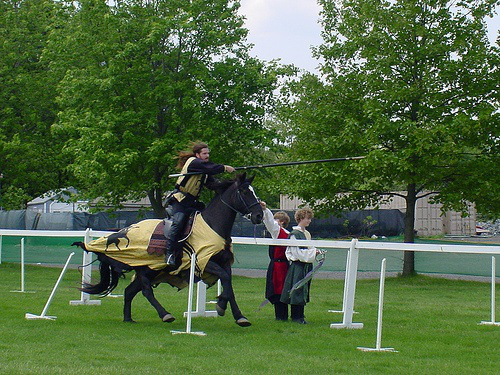

In [128]:
test_img = s_data[0]
test_img

In [129]:
import math
# converting the test image into tensor
im_tensor = torchvision.transforms.ToTensor()(test_img)
im_tensor = im_tensor.unsqueeze(0).float().to(device)
# take the model as evaluation mode
pre_model.eval()
pre_model.roi_head.low_score_threshold = 0.7
rpn_output, frcnn_output = pre_model(im_tensor, None)

In [130]:
rpn_output

{'proposals': tensor([[436.9424, 325.0865, 491.5687, 519.9869],
         [443.5288, 335.0974, 503.4879, 515.0003],
         [208.8061, 223.0393, 409.1337, 600.0000],
         ...,
         [ 86.7105, 188.6293, 133.6252, 231.8101],
         [ 67.7261, 186.2398, 114.8960, 224.9823],
         [536.6464,  61.3152, 582.4988, 107.2321]]),
 'scores': tensor([1.0000, 1.0000, 0.9999,  ..., 0.0011, 0.0011, 0.0011])}

In [131]:
frcnn_output

{'boxes': tensor([[436.1764, 344.1305, 517.5099, 522.6951],
         [259.5970, 219.5284, 378.1536, 486.6385],
         [157.7520, 301.8586, 433.8430, 546.8123]], grad_fn=<IndexBackward0>),
 'scores': tensor([0.9894, 0.8952, 0.7898], grad_fn=<IndexBackward0>),
 'labels': tensor([15, 15, 13]),
 'bboxes': tensor([[272.6103, 215.0816, 323.4437, 326.6844],
         [162.2481, 137.2052, 236.3460, 304.1490],
         [ 98.5950, 188.6616, 271.1519, 341.7577]], grad_fn=<StackBackward0>)}

In [153]:
# bboxes is the transformed output and boxes are the original output from the model
boxes = frcnn_output['bboxes']
labels = frcnn_output['labels']
scores = frcnn_output['scores']

In [156]:
# function to draw bounding box over the input image 
import cv2
import numpy as np
from PIL import Image

def draw_boxes_on_image(image, boxes, labels, scores, obj_to_idx, score_threshold=0.5):
    """
    Draw bounding boxes on the image with class labels and confidence scores.
    Args:
        image (ndarray): The input image to draw the bounding boxes on.
        boxes (Tensor): The predicted bounding boxes (xmin, ymin, xmax, ymax).
        labels (Tensor): The predicted class labels (indices from obj_to_idx).
        scores (Tensor): The confidence scores for each prediction.
        obj_to_idx (dict): Mapping of class names to indices.
        score_threshold (float): Minimum score threshold to display the boxes.
    Returns:
        image (ndarray): The image with the drawn bounding boxes.
    """
    # Convert the image to the format compatible with OpenCV (if necessary)
    if isinstance(image, Image.Image):
        image = np.array(image)
        
    image = image.astype(np.uint8)

    for i in range(len(boxes)):
        # Only draw boxes with a score above the threshold
        if scores[i] > score_threshold:
            xmin, ymin, xmax, ymax = boxes[i]

            # Get the class name using the label index from obj_to_idx
            label_idx = labels[i]  # Convert tensor to Python number
            class_name = [key for key, value in obj_to_idx.items() if value == label_idx][0]

            # Draw the bounding box and label on the image
            color = (0, 255, 0)  # Green color for the box
            thickness = 2
            cv2.rectangle(image, (int(xmin), int(ymin)), (int(xmax), int(ymax)), color, thickness)

            # Label text
            label_text = f'{class_name}: {scores[i]:.2f}'
            font = cv2.FONT_HERSHEY_SIMPLEX
            font_scale = 0.5
            font_thickness = 1
            cv2.putText(image, label_text, (int(xmin), int(ymin)-10), font, font_scale, color, font_thickness)

    return image


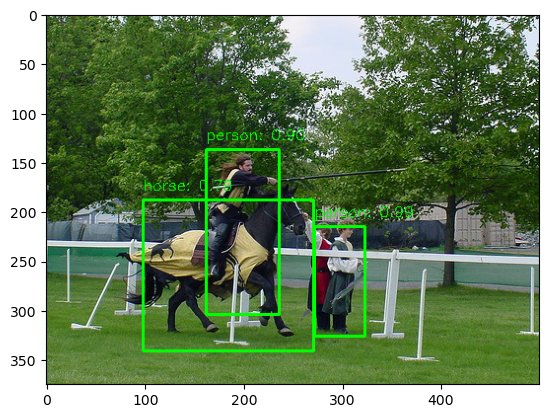

In [157]:
# plot the sample image with ground truth annotations 
annoted_img = draw_boxes_on_image(test_img, boxes, labels, scores, obj_to_idx, score_threshold=0.7)
plt.imshow(annoted_img)
plt.show()

In [158]:
# FUNCTION TO GET PREDICTED IMAGE 

def get_prediction(model, test_img, low_threshold, plot_threshold):
    model.eval()
    test_img_tensor = torchvision.transforms.ToTensor()(test_img)
    test_img_tensor = test_img_tensor.unsqueeze(0).float().to(device)
    
    model.roi_head.low_score_threshold = low_threshold
    rpn_output, frcnn_output = model(test_img_tensor, None)
    
    pred_boxes = frcnn_output['bboxes']
    pred_labels = frcnn_output['labels']
    pred_scores = frcnn_output['scores']

    annot_img = draw_boxes_on_image(test_img, pred_boxes, pred_labels, pred_scores, obj_to_idx, score_threshold=plot_threshold)
    plt.imshow(annot_img)
    plt.show()
    return annot_img

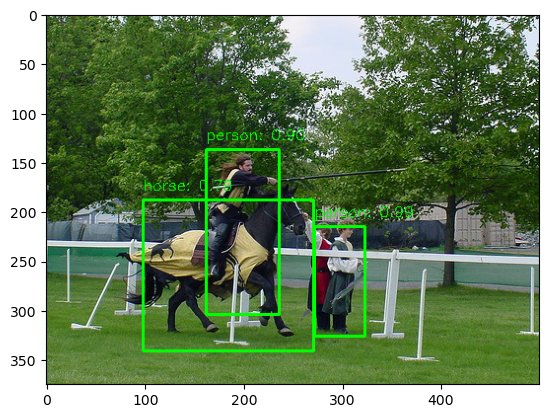

In [160]:
a = get_prediction(pre_model, test_img, low_threshold=0.7, plot_threshold=0.7)

In [169]:
def get_prediction(model, test_img, low_threshold, plot_threshold):
    model.eval()
    
    # Start the timer
    start_time = time.time()
    
    # Convert image to tensor and move it to device
    test_img_tensor = torchvision.transforms.ToTensor()(test_img)
    test_img_tensor = test_img_tensor.unsqueeze(0).float().to(device)
    
    model.roi_head.low_score_threshold = low_threshold
    rpn_output, frcnn_output = model(test_img_tensor, None)
    
    # Extract predictions
    pred_boxes = frcnn_output['bboxes']
    pred_labels = frcnn_output['labels']
    pred_scores = frcnn_output['scores']

    # Calculate the time taken for the prediction
    inference_time = time.time() - start_time
    print(f"Inference time: {inference_time:.4f} seconds")

    # Annotate the image with bounding boxes
    annot_img = draw_boxes_on_image(test_img, pred_boxes, pred_labels, pred_scores, obj_to_idx, score_threshold=plot_threshold)

    # Convert inference time to a string and add to the image
    inference_text = f"Inference time: {inference_time:.4f}s"
    font = cv2.FONT_HERSHEY_SIMPLEX
    
    # Adding the inference time text to the image in red color and positioned on the left
    cv2.putText(annot_img, inference_text, (10, 30), font, 0.7, (0, 0, 255), 2)  # Red color (0, 0, 255)

    # Display the annotated image
    plt.imshow(annot_img)
    plt.show()

    return annot_img

Inference time: 1.3262 seconds


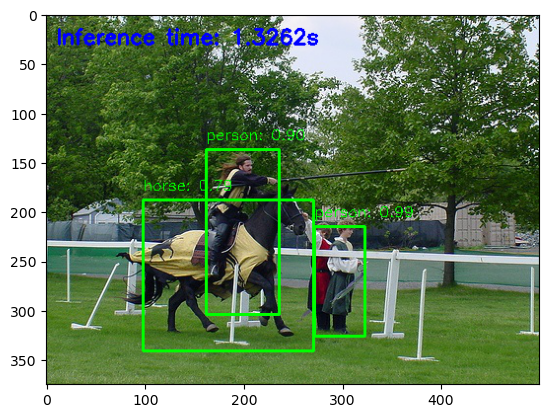

In [170]:
a = get_prediction(pre_model, test_img, low_threshold=0.7, plot_threshold=0.7)

Inference time: 1.4162 seconds


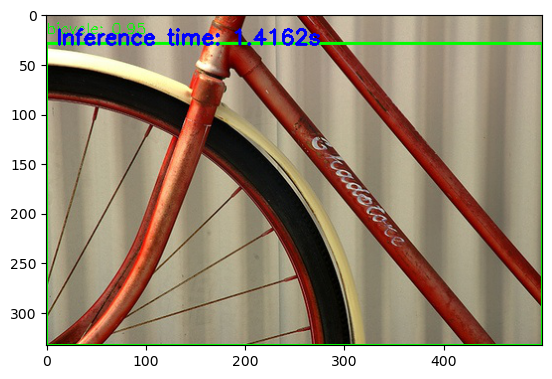

Inference time: 1.4556 seconds


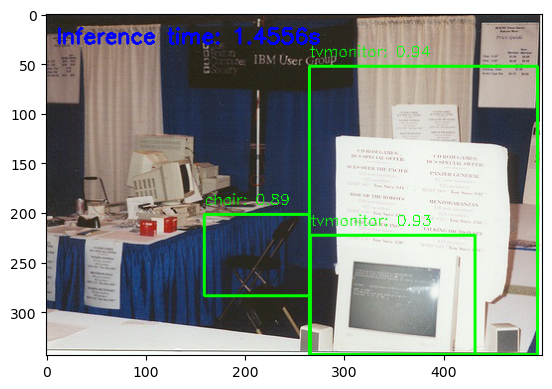

Inference time: 1.3088 seconds


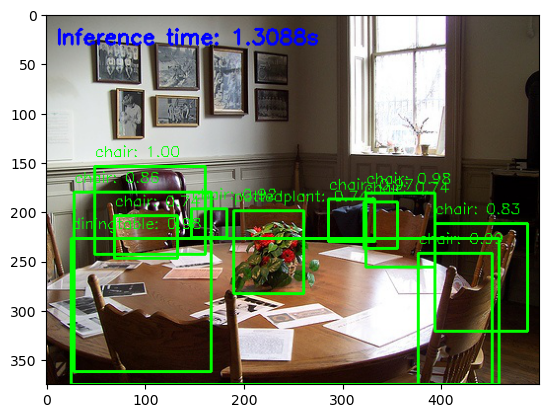

Inference time: 1.2671 seconds


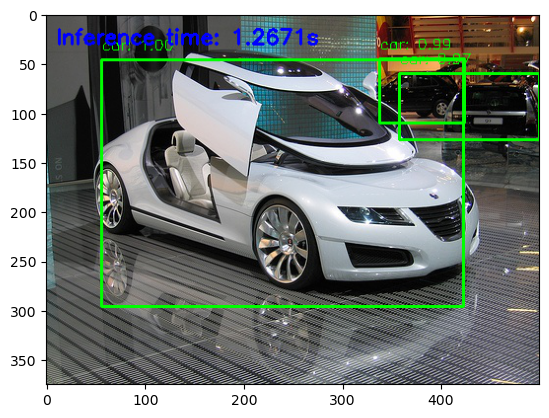

Inference time: 1.2532 seconds


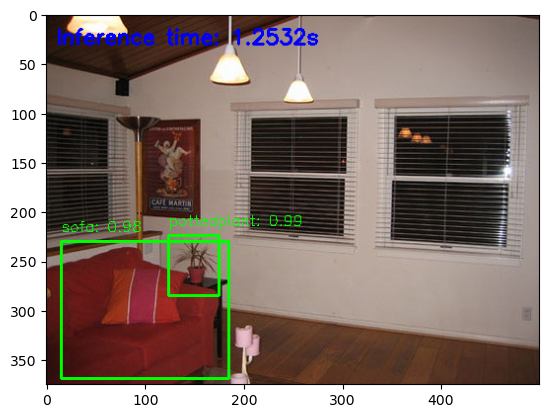

Inference time: 1.2655 seconds


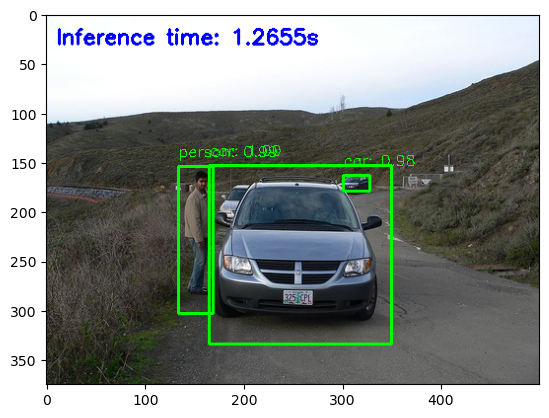

Inference time: 1.2895 seconds


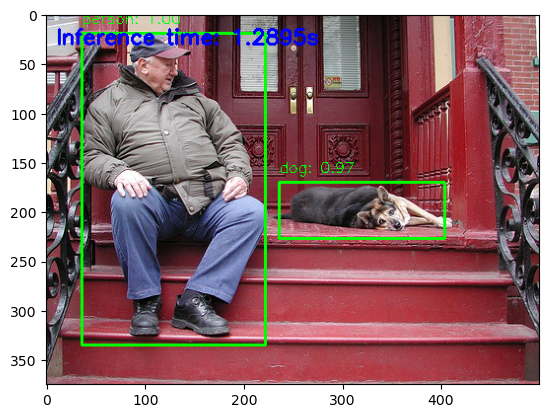

Inference time: 1.2818 seconds


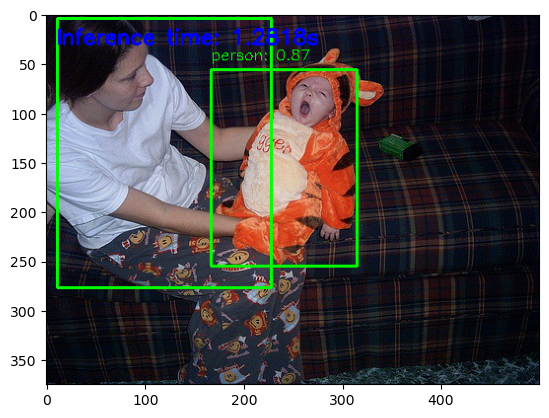

Inference time: 1.3383 seconds


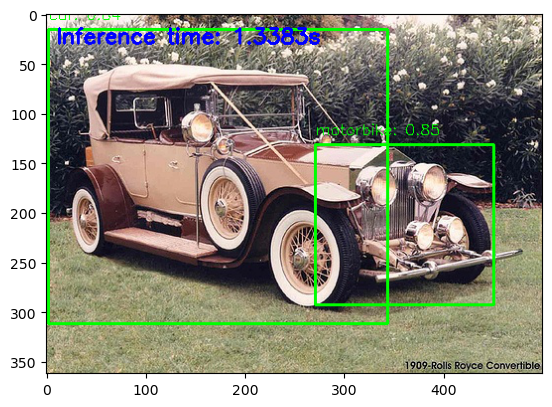

Inference time: 1.2983 seconds


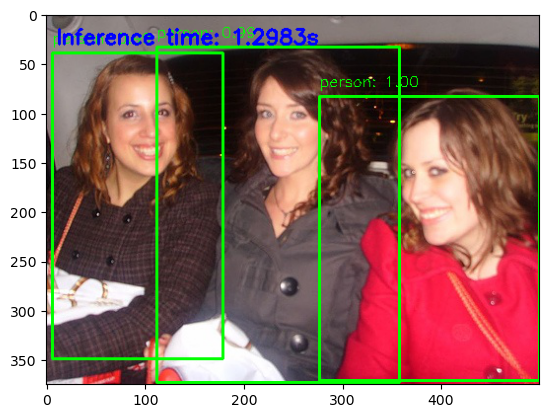

Inference time: 1.2847 seconds


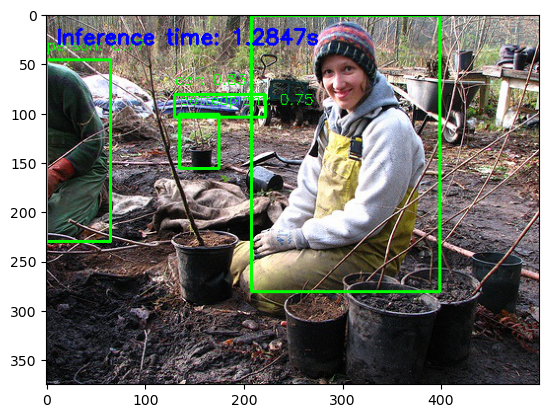

Inference time: 1.2628 seconds


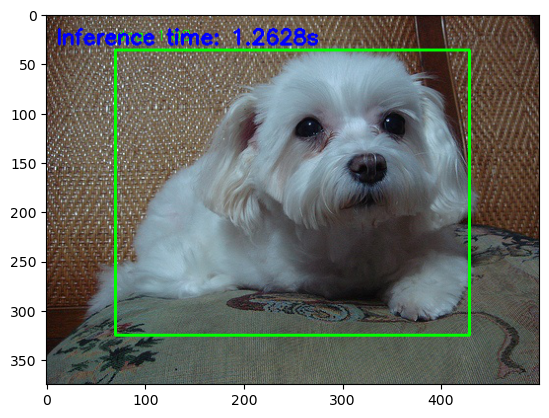

Inference time: 1.3936 seconds


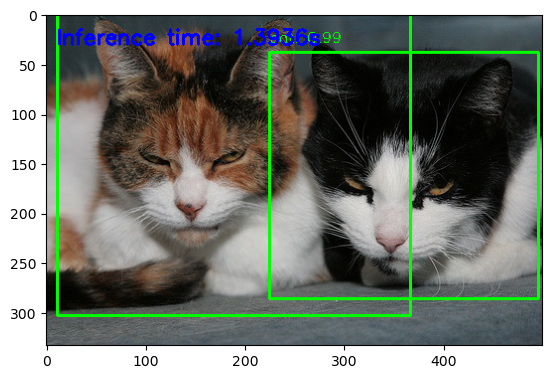

Inference time: 1.3939 seconds


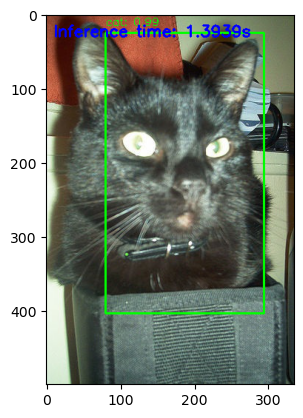

Inference time: 1.2684 seconds


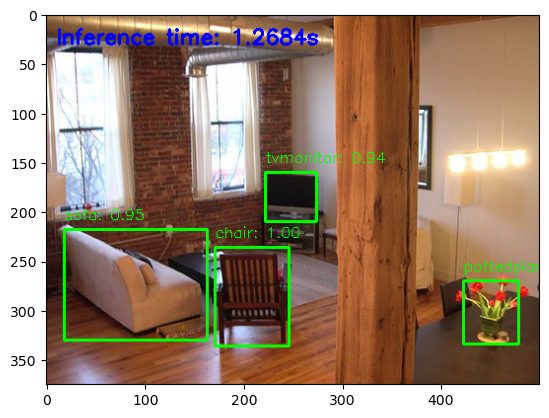

Inference time: 1.3057 seconds


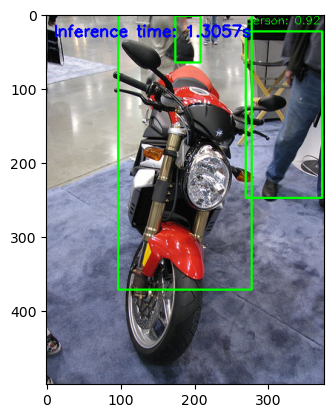

Inference time: 1.2950 seconds


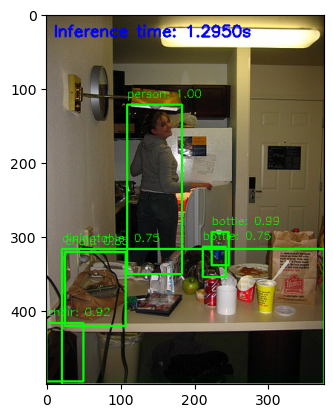

Inference time: 1.2996 seconds


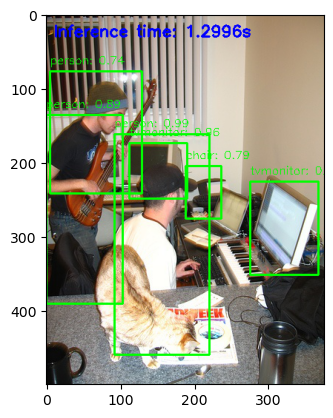

In [175]:
for i in range(100, 1000, 50):
    a = get_prediction(pre_model, voc_dataset_val[i][0], low_threshold=0.7, plot_threshold=0.7)

#### Evaluation

In [ ]:
# calculate mAP for the validation sets 

In [34]:
# function to get IoU
def get_iou_eval(det_box, gt_box):
    """
    det_box: detected box
    gt_box: ground truth box
    """
    det_box_x1, det_box_y1, det_box_x2, det_box_y2 = det_box
    gt_box_x1, gt_box_y1, gt_box_x2, gt_box_y2 = gt_box

    x_left = max(det_box_x1, gt_box_x1)
    y_top = max(det_box_y1, gt_box_y1)
    x_right = min(det_box_x2, gt_box_x2)
    y_bottom = min(det_box_y2, gt_box_y2)

    if x_right < x_left or y_bottom < y_top:
        return 0.0 

    # calculate area of intersection 
    area_intersection = (x_right - x_left) * (y_bottom - y_top)
    det_box_area = (det_box_x2 - det_box_x1) * (det_box_y2 - det_box_y1)
    gt_box_area = (gt_box_x2 - gt_box_x1) * (gt_box_y2 - gt_box_y1)
    area_union = float(det_box_area + gt_box_area - area_intersection + 1E-6)
    iou = area_intersection / area_union
    return iou

In [43]:
# FUNCTION TO COMPUTE mAP
def compute_map(pred_boxes, gt_boxes, iou_threshold=0.5, method="area"):
    """
    This function takes predicted boxes and ground truth boxes to calculate the
    mean average precision score.
    :pred_boxes -> predicted boxes for detection by model  
    :gt_boxes -> ground truth boxes 
    pred_boxes = [
    {
        'person': [[x1, y1, x2, y2, score], ...],
        'car': [[x1, y1, x2, y2, score], ...]
    }
    {pred_boxes_img_2},
    ...
    {pred_boxes_img_N}
    ]

    gt_boxes = [
    {
        'person': [[x1, y1, x2, y2], ...],
        'car': [[x1, y1, x2, y2], ...]
    }
    {gt_boxes_img_2},
    ...
    {gt_boxes_img_N}
    ]
    """
    gt_labels = {cls_key for im_gt in gt_boxes for cls_key in im_gt.keys()}
    gt_labels = sorted(gt_labels)
    all_aps = {} 
    # average precision for all classes 
    aps = []
    for idx, label in enumerate(gt_labels):
        cls_preds = [
            [im_idx, im_preds_label] for im_idx, im_preds in enumerate(pred_boxes)
            if label in im_preds for im_preds_label in im_preds[label]
        ]
        # cls_preds = [
        # (0, [x1_0, y1_0, x2_0, y2_0, score_0])
        # ....
        # (1, [x1_N, y1_N, x2_N, y2_N, score_N])
        # ]
        
        # sort the prediction boxes by confidence scores 
        cls_preds = sorted(cls_preds, key=lambda k: -k[1][-1])
    
        # tracking matached gt boxes of this class 
        gt_matched = [[False for _ in img_gts[label]] for img_gts in gt_boxes]
        # number of gt boxes for this class for recall calculation
        num_gts = sum([len(img_gts[label]) for img_gts in gt_boxes])
        tp = [0] * len(cls_preds)
        fp = [0] * len(cls_preds)

        # for each prediction
        for pred_idx, (im_idx, det_pred) in enumerate(cls_preds):
            # get gt boxes for this image and this label 
            img_gts = gt_boxes[im_idx][label]
            max_iou_found = -1
            max_iou_gt_idx = -1

            # get best matching bounding box 
            for gt_box_idx, gt_box in enumerate(img_gts):
                gt_box_iou = get_iou_eval(det_pred[:-1], gt_box)
                if gt_box_iou > max_iou_found:
                    max_iou_found = gt_box_iou
                    max_iou_gt_idx = gt_box_idx
            # TP only if iou>= threshold and this gt has not yet been matched 
            if max_iou_found < iou_threshold or gt_matched[im_idx][max_iou_gt_idx]:
                fp[pred_idx] = 1
            else:
                tp[pred_idx] = 1
        # cumulative tp and fp
        tp = np.cumsum(tp)
        fp = np.cumsum(fp)

        eps = np.finfo(np.float32).eps
        recalls = tp / np.maximum(num_gts, eps)
        precisions = tp / np.maximum((tp + fp), eps)

        if method == "area":
            recalls = np.concatenate(([0.0], recalls, [1.0]))
            precisions = np.concatenate(([0.0], precisions, [0.0]))

            # Replace precision values with recall r with maximum precision value 
            # of only recall value >= r
            # This computes the precision envelpoe
            for i in range(precisions.size -1, 0, -1):
                precisions[i-1] = np.maximum(precisions[i-1], precisions[i])
            # for computing area, get points where recall changes value
            i = np.where(recalls[1:] != recalls[:-1])[0]
            # Add the rectangular areas to get ap 
            ap = np.sum((recalls[i+1] - recalls[i]) * precisions[i+1])
        elif method == "interp":
            ap = 0.0
            for interp_pt in np.arange(0, 1+1E-3, 0.1):
                # get precision values for recall values 
                prec_interp_pt = precisions[recalls >= interp_pt]
                # get maximum of those precision values 
                prec_interp_pt = prec_interp_pt.max() if prec_interp_pt.size > 0.0 else 0.0
                ap += prec_interp_pt
            ap = ap / 11.00
        else:
            raise ValueError('Method can only be area or interp')
        if num_gts > 0:
            aps.append(ap)
            all_aps[label] = ap
        else:
            all_aps[label] = np.nan
        
    # compute mAP at provided iou threshold 
    mean_ap = sum(aps) / len(aps)
    return mean_ap, all_aps

In [36]:
import math
# evalutiion with valid loader 
pre_model.eval()
gts = []
preds = []

for im, target, f_name in tqdm(valid_loader):
    # im_name = f_name
    torch.cuda.empty_cache()
    im = im.float().to(device)
    target_boxes = target['bboxes'].float().to(device)
    target_boxes = target_boxes.squeeze(0)
    # print(f"Shape of target_boxes: {target_boxes.shape}")
    target_labels = target['labels'].long().to(device)
    target_labels = target_labels.squeeze(0)
    # print(f"Shape of target labels: {target_labels.shape}")
    
    with torch.no_grad():  # Disable gradient calculations for evaluation
        rpn_output, frcnn_output = pre_model(im, None)

    boxes = frcnn_output['boxes']
    labels = frcnn_output['labels']
    scores = frcnn_output['scores']

    pred_boxes = {}
    gt_boxes = {}

    for label_name in obj_to_idx:
        pred_boxes[label_name] = []
        gt_boxes[label_name] = []
    
    for idx, box in enumerate(boxes):
        if device=='cuda':
            x1, y1, x2, y2 = box.detach().cpu().numpy()
            label = labels[idx].detach().cpu().item()
            score = scores[idx].detach().cpu().item()
        else:
            # print(f"From the prediction: {box}")
            x1, y1, x2, y2 = box
            label = labels[idx].item()
            score = scores[idx].item()
        label_name = idx_to_obj[label]
        pred_boxes[label_name].append([x1, y1, x2, y2, score])

    for idx, box in enumerate(target_boxes):
        if device=='cuda':
            x1, y1, x2, y2 = box.detach().cpu().numpy()
            label = target_labels[idx].detach().cpu().item()
        else:
            # print(f"From the target: {box}")
            x1, y1, x2, y2 = box
            label = target_labels[idx].item()
        label_name = idx_to_obj[label]
        gt_boxes[label_name].append([x1, y1, x2, y2])

    gts.append(gt_boxes)
    preds.append(pred_boxes)

100%|██████████| 2510/2510 [06:01<00:00,  6.94it/s]


In [38]:
print(f"Total ground truth values: {len(gts)}")
print(f"Total predicted values: {len(preds)}")

Total ground truth values: 2510
Total predicted values: 2510


In [41]:
preds[1]

{'background': [],
 'aeroplane': [],
 'bicycle': [],
 'bird': [],
 'boat': [],
 'bottle': [],
 'bus': [],
 'car': [[tensor(220.8455, device='cuda:0'),
   tensor(109.8308, device='cuda:0'),
   tensor(900., device='cuda:0'),
   tensor(543.9311, device='cuda:0'),
   0.9995693564414978],
  [tensor(698.8990, device='cuda:0'),
   tensor(117.8085, device='cuda:0'),
   tensor(893.6177, device='cuda:0'),
   tensor(509.5076, device='cuda:0'),
   0.0523194819688797]],
 'cat': [],
 'chair': [],
 'cow': [],
 'diningtable': [],
 'dog': [],
 'horse': [],
 'motorbike': [],
 'person': [],
 'pottedplant': [],
 'sheep': [],
 'sofa': [],
 'train': [],
 'tvmonitor': []}

In [48]:
# getting mean average precision and all average precision scores 
mean_ap, all_aps = compute_map(preds, gts, method='interp')

In [49]:
mean_ap

0.007553442432121397

In [50]:
print(f"Class Wise Average Precision==>")
for idx in range(len(idx_to_obj)):
    class_name = idx_to_obj[idx]  # Get the class name
    if class_name in all_aps:
        ap = all_aps[class_name]
        print('AP for class {} = {:.4f}'.format(class_name, ap))
    else:
        print('AP for class {} = NaN (no ground truth)'.format(class_name))
print(f"Mean Average Precision (mAP): {mean_ap:.4f}")


Class Wise Average Precision==>
AP for class background = nan
AP for class aeroplane = 0.0028
AP for class bicycle = 0.0003
AP for class bird = 0.0035
AP for class boat = 0.0087
AP for class bottle = 0.0052
AP for class bus = 0.0034
AP for class car = 0.0015
AP for class cat = 0.0114
AP for class chair = 0.0004
AP for class cow = 0.0007
AP for class diningtable = 0.0011
AP for class dog = 0.0018
AP for class horse = 0.0018
AP for class motorbike = 0.0020
AP for class person = 0.0020
AP for class pottedplant = 0.0051
AP for class sheep = 0.0909
AP for class sofa = 0.0029
AP for class train = 0.0053
AP for class tvmonitor = 0.0004
Mean Average Precision (mAP): 0.0076


In [52]:
def compute_map_2(det_boxes, gt_boxes, iou_threshold=0.5, method='area'):
    # det_boxes = [
    #   {
    #       'person' : [[x1, y1, x2, y2, score], ...],
    #       'car' : [[x1, y1, x2, y2, score], ...]
    #   }
    #   {det_boxes_img_2},
    #   ...
    #   {det_boxes_img_N},
    # ]
    #
    # gt_boxes = [
    #   {
    #       'person' : [[x1, y1, x2, y2], ...],
    #       'car' : [[x1, y1, x2, y2], ...]
    #   },
    #   {gt_boxes_img_2},
    #   ...
    #   {gt_boxes_img_N},
    # ]
    
    gt_labels = {cls_key for im_gt in gt_boxes for cls_key in im_gt.keys()}
    gt_labels = sorted(gt_labels)
    all_aps = {}
    # average precisions for ALL classes
    aps = []
    for idx, label in enumerate(gt_labels):
        # Get detection predictions of this class
        cls_dets = [
            [im_idx, im_dets_label] for im_idx, im_dets in enumerate(det_boxes)
            if label in im_dets for im_dets_label in im_dets[label]
        ]
        
        # cls_dets = [
        #   (0, [x1_0, y1_0, x2_0, y2_0, score_0]),
        #   ...
        #   (0, [x1_M, y1_M, x2_M, y2_M, score_M]),
        #   (1, [x1_0, y1_0, x2_0, y2_0, score_0]),
        #   ...
        #   (1, [x1_N, y1_N, x2_N, y2_N, score_N]),
        #   ...
        # ]
        
        # Sort them by confidence score
        cls_dets = sorted(cls_dets, key=lambda k: -k[1][-1])
        
        # For tracking which gt boxes of this class have already been matched
        gt_matched = [[False for _ in im_gts[label]] for im_gts in gt_boxes]
        # Number of gt boxes for this class for recall calculation
        num_gts = sum([len(im_gts[label]) for im_gts in gt_boxes])
        tp = [0] * len(cls_dets)
        fp = [0] * len(cls_dets)
        
        # For each prediction
        for det_idx, (im_idx, det_pred) in enumerate(cls_dets):
            # Get gt boxes for this image and this label
            im_gts = gt_boxes[im_idx][label]
            max_iou_found = -1
            max_iou_gt_idx = -1
            
            # Get best matching gt box
            for gt_box_idx, gt_box in enumerate(im_gts):
                gt_box_iou =get_iou_eval(det_pred[:-1], gt_box)
                if gt_box_iou > max_iou_found:
                    max_iou_found = gt_box_iou
                    max_iou_gt_idx = gt_box_idx
            # TP only if iou >= threshold and this gt has not yet been matched
            if max_iou_found < iou_threshold or gt_matched[im_idx][max_iou_gt_idx]:
                fp[det_idx] = 1
            else:
                tp[det_idx] = 1
                # If tp then we set this gt box as matched
                gt_matched[im_idx][max_iou_gt_idx] = True
        # Cumulative tp and fp
        tp = np.cumsum(tp)
        fp = np.cumsum(fp)
        
        eps = np.finfo(np.float32).eps
        recalls = tp / np.maximum(num_gts, eps)
        precisions = tp / np.maximum((tp + fp), eps)

        if method == 'area':
            recalls = np.concatenate(([0.0], recalls, [1.0]))
            precisions = np.concatenate(([0.0], precisions, [0.0]))
            
            # Replace precision values with recall r with maximum precision value
            # of any recall value >= r
            # This computes the precision envelope
            for i in range(precisions.size - 1, 0, -1):
                precisions[i - 1] = np.maximum(precisions[i - 1], precisions[i])
            # For computing area, get points where recall changes value
            i = np.where(recalls[1:] != recalls[:-1])[0]
            # Add the rectangular areas to get ap
            ap = np.sum((recalls[i + 1] - recalls[i]) * precisions[i + 1])
        elif method == 'interp':
            ap = 0.0
            for interp_pt in np.arange(0, 1 + 1E-3, 0.1):
                # Get precision values for recall values >= interp_pt
                prec_interp_pt = precisions[recalls >= interp_pt]
                
                # Get max of those precision values
                prec_interp_pt = prec_interp_pt.max() if prec_interp_pt.size > 0.0 else 0.0
                ap += prec_interp_pt
            ap = ap / 11.0
        else:
            raise ValueError('Method can only be area or interp')
        if num_gts > 0:
            aps.append(ap)
            all_aps[label] = ap
        else:
            all_aps[label] = np.nan
    # compute mAP at provided iou threshold
    mean_ap = sum(aps) / len(aps)
    return mean_ap, all_aps


In [55]:
# getting mean average precision and all average precision scores 
mean_ap, all_aps = compute_map_2(preds, gts, iou_threshold=0.3, method='interp')

In [56]:
print(f"Class Wise Average Precision==>")
for idx in range(len(idx_to_obj)):
    class_name = idx_to_obj[idx]  # Get the class name
    if class_name in all_aps:
        ap = all_aps[class_name]
        print('AP for class {} = {:.4f}'.format(class_name, ap))
    else:
        print('AP for class {} = NaN (no ground truth)'.format(class_name))
print(f"Mean Average Precision (mAP): {mean_ap:.4f}")


Class Wise Average Precision==>
AP for class background = nan
AP for class aeroplane = 0.0188
AP for class bicycle = 0.0303
AP for class bird = 0.0212
AP for class boat = 0.0182
AP for class bottle = 0.0347
AP for class bus = 0.0256
AP for class car = 0.0301
AP for class cat = 0.0746
AP for class chair = 0.0101
AP for class cow = 0.0052
AP for class diningtable = 0.0195
AP for class dog = 0.0388
AP for class horse = 0.0554
AP for class motorbike = 0.1004
AP for class person = 0.1027
AP for class pottedplant = 0.0227
AP for class sheep = 0.1032
AP for class sofa = 0.0360
AP for class train = 0.1089
AP for class tvmonitor = 0.0493
Mean Average Precision (mAP): 0.0453


In [57]:
gt_count = {label: sum(len(gt[label]) for gt in gts if label in gt) for label in idx_to_obj.values()}
print(f"Ground truth distribution: {gt_count}")


Ground truth distribution: {'background': 0, 'aeroplane': 175, 'bicycle': 216, 'bird': 305, 'boat': 190, 'bottle': 296, 'bus': 141, 'car': 818, 'cat': 198, 'chair': 706, 'cow': 171, 'diningtable': 162, 'dog': 267, 'horse': 199, 'motorbike': 197, 'person': 2742, 'pottedplant': 320, 'sheep': 162, 'sofa': 207, 'train': 170, 'tvmonitor': 176}


In [59]:
pred_count = {label: sum(len(pred[label]) for pred in preds if label in pred) for label in idx_to_obj.values()}
print(f"Prediction count distribution: {pred_count}")

Prediction count distribution: {'background': 0, 'aeroplane': 385, 'bicycle': 458, 'bird': 620, 'boat': 869, 'bottle': 905, 'bus': 346, 'car': 2132, 'cat': 390, 'chair': 3072, 'cow': 337, 'diningtable': 457, 'dog': 527, 'horse': 308, 'motorbike': 407, 'person': 6854, 'pottedplant': 1159, 'sheep': 382, 'sofa': 460, 'train': 455, 'tvmonitor': 616}


In [61]:
CONFIDENCE_THRESHOLD = 0.5
filtered_preds = []
for pred in preds:
    filtered_preds.append({
        cls: [box for box in pred[cls] if box[4] >= CONFIDENCE_THRESHOLD]
        for cls in pred
    })
filtered_preds

[{'background': [],
  'aeroplane': [],
  'bicycle': [],
  'bird': [],
  'boat': [],
  'bottle': [],
  'bus': [],
  'car': [],
  'cat': [],
  'chair': [[tensor(0., device='cuda:0'),
    tensor(410.1252, device='cuda:0'),
    tensor(109.4744, device='cuda:0'),
    tensor(581.8143, device='cuda:0'),
    0.9904206991195679],
   [tensor(391.4914, device='cuda:0'),
    tensor(311.1270, device='cuda:0'),
    tensor(494.7399, device='cuda:0'),
    tensor(505.7345, device='cuda:0'),
    0.9351489543914795],
   [tensor(265.6484, device='cuda:0'),
    tensor(434.2971, device='cuda:0'),
    tensor(393.8032, device='cuda:0'),
    tensor(595.7441, device='cuda:0'),
    0.9243245124816895],
   [tensor(301.8310, device='cuda:0'),
    tensor(370.2978, device='cuda:0'),
    tensor(479.9985, device='cuda:0'),
    tensor(578.4871, device='cuda:0'),
    0.5055268406867981]],
  'cow': [],
  'diningtable': [],
  'dog': [],
  'horse': [],
  'motorbike': [],
  'person': [],
  'pottedplant': [],
  'sheep': [],


In [62]:
mean_ap, all_aps = compute_map(filtered_preds, gts, method='interp')
print(f"Mean Average Precision (mAP): {mean_ap:.4f}")

Mean Average Precision (mAP): 0.0074


In [34]:
len(idx_to_obj)

21

In [1]:
import torch
torch.cuda.empty_cache()

In [2]:
del im, target, rpn_output, frcnn_output
torch.cuda.empty_cache()

NameError: name 'im' is not defined

In [3]:
!nvidia-smi

Wed Dec  4 10:21:13 2024       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 565.90                 Driver Version: 565.90         CUDA Version: 12.7     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                  Driver-Model | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  NVIDIA GeForce RTX 3050      WDDM  |   00000000:01:00.0 Off |                  N/A |
|  0%   35C    P8              5W /   70W |     365MiB /   6144MiB |      0%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

#### Drafts

In [39]:
# Bounding box proposals
proposals = torch.tensor([
    [102., 467., 191., 523.],
    [426., 455., 479., 546.],
    [ 70., 473., 149., 506.],
    [170., 234., 211., 303.],
    [ 35., 295., 102., 374.]
])

# Ground truth boxes
ground_truths = torch.tensor([
    [104., 457., 196., 480.],
    [429., 449., 488., 480.],
    [ 72., 473., 145., 480.],
    [177., 243., 208., 296.],
    [ 28., 299., 105., 381.]
])

demo_matrix = get_iou(proposals, ground_truths)
demo_matrix

tensor([[0.1895, 0.0000, 0.0580, 0.0000, 0.0000],
        [0.0000, 0.2314, 0.0000, 0.0000, 0.0000],
        [0.0715, 0.0000, 0.1960, 0.0000, 0.0000],
        [0.0000, 0.0000, 0.0000, 0.5808, 0.0000],
        [0.0000, 0.0000, 0.0000, 0.0000, 0.7634]])

In [40]:
best_match_iou, best_match_gt_idx = demo_matrix.max(dim=0)
print(best_match_iou, best_match_gt_idx)

tensor([0.1895, 0.2314, 0.1960, 0.5808, 0.7634]) tensor([0, 1, 2, 3, 4])


In [41]:
background_proposals = best_match_iou < 0.5
print(background_proposals)

tensor([ True,  True,  True, False, False])


In [42]:
print(best_match_gt_idx)
best_match_gt_idx[background_proposals] = -1
print(best_match_gt_idx)

tensor([0, 1, 2, 3, 4])
tensor([-1, -1, -1,  3,  4])


In [44]:
# Get matched GT boxes for all proposals
# matched_gt_boxes_for_proposals = gt_boxes[best_match_gt_idx.clamp(min=0)]
# labels = gt_labels[best_match_gt_idx.clamp(min=0)].to(dtype=torch.int64)

# # Update background proposals to label 0 (background)
# labels[background_proposals] = 0

# # Set ignored proposals as label -1
# labels[ignored_proposals] = -1

In [45]:
c = best_match_gt_idx.clamp(min=0)
c

tensor([0, 0, 0, 3, 4])

In [46]:
matched_gt_boxes_for_proposals = ground_truths[best_match_gt_idx.clamp(min=0)]
matched_gt_boxes_for_proposals

tensor([[104., 457., 196., 480.],
        [104., 457., 196., 480.],
        [104., 457., 196., 480.],
        [177., 243., 208., 296.],
        [ 28., 299., 105., 381.]])

In [47]:
gt_labels = torch.tensor([1,2,1,1,4])

In [48]:
labels = gt_labels[best_match_gt_idx.clamp(min=0)].to(dtype=torch.int64)
labels

tensor([1, 1, 1, 1, 4])

In [49]:
labels[background_proposals] = 0
labels

tensor([0, 0, 0, 1, 4])

In [50]:
print(type(labels))

<class 'torch.Tensor'>


In [51]:
positive = torch.where(labels >= 1)[0]
positive

tensor([3, 4])